### Introduction

In the previous post, we implemented the upsampling and made sure it is correct
by comparing it to the implementation of the [scikit-image library](http://scikit-image.org/).
To be more specific we had _FCN-32_ _Segmentation_ network implemented which is
described in the paper _Fully convolutional networks for semantic segmentation_.

In this post we will perform a simple training: we will get a sample image from
[PASCAL VOC](http://host.robots.ox.ac.uk/pascal/VOC/) dataset along with annotation,
train our network on them and test our network on the same image. It was done this way
so that it can also be run on CPU -- it takes only 10 iterations for the training to complete.
Another point of this post is to show that segmentation that our network (FCN-32s) produces is
very coarse -- even if we run it on the same image that we were training it on. In this post
we tackle this problem by performing Conditional Random Field post-processing stage, which
refines our segmentation by taking into account pure RGB features of image and probabilities
produced by our network. Overall, we get a refined segmentation. The set-up of this post
is very simple on purpose. Similar approach to Segmentation was described in the paper
_Semantic Image Segmentation with Deep Convolutional Nets and Fully Connected CRFs_ by Chen et al.

The blog post is created using jupyter notebook. After each chunk of a code
you can see the result of its evaluation. You can also get the notebook
file from [here](http://google.com). The content of the blog post
is partially borrowed from [slim walkthough notebook](https://github.com/tensorflow/models/blob/master/slim/slim_walkthough.ipynb).

### Setup



To be able to run the code, you will need to have Tensorflow installed. I have used _r0.12_.
You will need to use [this fork of _tensorflow/models_](https://github.com/tensorflow/models/pull/684). 

I am also using scikit-image library and numpy for this tutorial plus other
dependencies. One of the ways to install them is to download _Anaconda_ software
package for python.

Follow all the other steps described in the previous posts -- it shows how to download
the _VGG-16_ model and I also forked the 

In [1]:
%matplotlib inline

from __future__ import division
import os
import tensorflow as tf
import numpy as np
from nets import vgg
from matplotlib import pyplot as plt
from preprocessing import vgg_preprocessing
from libs.scale_input_image import scale_randomly_image_with_annotation_with_fixed_size_output
from libs.training import get_valid_logits_and_labels

# Load the mean pixel values and the function
# that performs the subtraction from each pixel
from preprocessing.vgg_preprocessing import (_mean_image_subtraction, _R_MEAN, _G_MEAN, _B_MEAN)
slim = tf.contrib.slim

# Data processing

In [2]:
#0:   background
#1:   aeroplane
#2:   bicycle
#3:   bird
#4:   boat
#5:   bottle
#6:   bus
#7:   car
#8:   cat
#9:   chair
#10:  cow
#11:  diningtable
#12:  dog
#13:  horse
#14:  motorbike
#15:  person
#16:  pottedplant
#17:  sheep
#18:  sofa
#19:  train
#20:  tvmonitor
#255: undefined/don't care
number_of_classes = 21
class_labels = [v for v in range((number_of_classes+1))]
class_labels[-1] = 255

### Upsampling helper functions and Image Loading

In [3]:
training_filenames = "/home/thalles/VOC2012/ImageSets/Segmentation/train.txt"
training_images_dir = "/home/thalles/VOC2012/JPEGImages/"
training_labels_dir = "/home/thalles/VOC2012/SegmentationClass_1D/"

In [4]:
checkpoints_dir = '/home/thalles/image-segmentation/vgg'
log_folder = '/home/thalles/log_folder'
vgg_checkpoint_path = os.path.join(checkpoints_dir, 'vgg_16.ckpt')

In [5]:
def model_input():
    is_training_placeholder = tf.placeholder(tf.bool)
    return is_training_placeholder

### Loss function definition and training using Adam Optimization Algorithm.

In [6]:
def model(processed_images, number_of_classes=21, is_training=True):
    
    with slim.arg_scope(vgg.vgg_arg_scope()):
        _, end_points = vgg.vgg_16(processed_images,
                                         num_classes=number_of_classes,
                                         is_training=True,
                                         spatial_squeeze=False,
                                         scope='vgg_16')

        input_shape = tf.shape(processed_images)

        #vgg_fc6_feature = end_points['vgg_16/fc6']
        
        # get the vggs pool5 feature map
        pool5_feature_map = end_points['vgg_16/pool5']
        pool5_feature_shape = tf.shape(pool5_feature_map)

        pool4_feature_map = end_points['vgg_16/pool4']
        pool4_feature_shape = tf.shape(pool4_feature_map)

        pool3_feature_map = end_points['vgg_16/pool3']
        pool3_feature_shape = tf.shape(pool3_feature_map)

        pool2_feature_map = end_points['vgg_16/pool2']
        pool2_feature_shape = tf.shape(pool2_feature_map)

        pool1_feature_map = end_points['vgg_16/pool1']
        pool1_feature_shape = tf.shape(pool1_feature_map)

        with tf.variable_scope("seg_vars"):
            
            # Merging Pooling 4 layer
            pool5_feature_resized = tf.image.resize_images(pool5_feature_map, 
                                                           [pool4_feature_shape[1],pool4_feature_shape[2]], method=1)
            pool5_feature_conv = slim.conv2d(pool5_feature_resized, 512, [3, 3], activation_fn=None)

            pool4_feature_conv = slim.conv2d(pool4_feature_map,
                                   512,
                                   [1, 1],
                                   activation_fn=None,
                                   normalizer_fn=None,
                                   weights_initializer=tf.zeros_initializer)

            pool5_conv_plus_poo4_conv = pool5_feature_conv + pool4_feature_conv
            pool5_conv_plus_poo4_conv = tf.contrib.layers.batch_norm(pool5_conv_plus_poo4_conv)
            
            # Merging Pooling 3 layer
            pool4_feature_resized = tf.image.resize_images(pool5_conv_plus_poo4_conv, 
                                                           (pool3_feature_shape[1], pool3_feature_shape[2]), method=1)
            pool4_feature_conv = slim.conv2d(pool4_feature_resized, 256, [3, 3], activation_fn=None)

            pool3_feature_conv = slim.conv2d(pool3_feature_map,
                                   256,
                                   [1, 1],
                                   activation_fn=None,
                                   normalizer_fn=None,
                                   weights_initializer=tf.zeros_initializer)

            pool4_conv_plus_pool3_conv = pool4_feature_conv + pool3_feature_conv
            pool4_conv_plus_pool3_conv = tf.contrib.layers.batch_norm(pool4_conv_plus_pool3_conv)
            
            # Merging Pooling 2 layer
            pool3_feature_resized = tf.image.resize_images(pool4_conv_plus_pool3_conv, 
                                                           (pool2_feature_shape[1], pool2_feature_shape[2]), method=1)
            pool3_feature_conv = slim.conv2d(pool3_feature_resized, 128, [3, 3], activation_fn=None)
            
            
            pool2_feature_conv = slim.conv2d(pool2_feature_map,
                                   128,
                                   [1, 1],
                                   activation_fn=None,
                                   normalizer_fn=None,
                                   weights_initializer=tf.zeros_initializer)

            pool3_conv_plus_pool2_conv = pool3_feature_conv + pool2_feature_conv
            pool3_conv_plus_pool2_conv = tf.contrib.layers.batch_norm(pool3_conv_plus_pool2_conv)
            
            # Merging Pooling1 layer
            pool2_feature_resized = tf.image.resize_images(pool3_conv_plus_pool2_conv, 
                                                           (pool1_feature_shape[1], pool1_feature_shape[2]), method=1)
            pool2_feature_conv = slim.conv2d(pool2_feature_resized, 64, [3, 3], activation_fn=None)
            
            
            pool1_feature_conv = slim.conv2d(pool1_feature_map,
                                   64,
                                   [1, 1],
                                   activation_fn=None,
                                   normalizer_fn=None,
                                   weights_initializer=tf.zeros_initializer)

            pool2_conv_plus_pool1_conv = pool2_feature_conv + pool1_feature_conv
            
            # Resize to original image shape
            orignal_image_shape = tf.image.resize_images(pool2_conv_plus_pool1_conv, 
                                                           (input_shape[1], input_shape[2]), method=1)
            orignal_image_conv = slim.conv2d(orignal_image_shape, 64, [3, 3], activation_fn=None)
            
            orignal_image_logits = slim.conv2d(orignal_image_conv, number_of_classes, [3, 3], activation_fn=None)
            return orignal_image_logits

In [8]:
def model_loss(upsampled_by_factor_16_logits, labels):
    labels = tf.squeeze(labels)
    valid_labels_batch_tensor, valid_logits_batch_tensor = get_valid_logits_and_labels(annotation_batch_tensor=labels,
                                                                                       logits_batch_tensor=upsampled_by_factor_16_logits,
                                                                                       class_labels=class_labels)


    cross_entropies = tf.nn.softmax_cross_entropy_with_logits(logits=valid_logits_batch_tensor,
                                                              labels=valid_labels_batch_tensor)

    cross_entropy_mean = tf.reduce_mean(cross_entropies)
    
    # Add summary op for the loss -- to be able to see it in tensorboard.
    tf.summary.scalar('cross_entropy_loss', cross_entropy_mean)

    # Tensor to get the final prediction for each pixel -- pay 
    # attention that we don't need softmax in this case because
    # we only need the final decision. If we also need the respective
    # probabilities we will have to apply softmax.
    pred = tf.argmax(upsampled_by_factor_16_logits, dimension=3)
    probabilities = tf.nn.softmax(upsampled_by_factor_16_logits)
    
    return cross_entropy_mean, pred, probabilities

In [9]:
def model_optimizer(cross_entropy_sum, learning_rate):
    # Here we define an optimizer and put all the variables
    # that will be created under a namespace of 'adam_vars'.
    # This is done so that we can easily access them later.
    # Those variables are used by adam optimizer and are not
    # related to variables of the vgg model.
    with tf.variable_scope("adam_vars"):
        train_step = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cross_entropy_sum)
    return train_step

In [14]:
image_size=[384, 384]
total_train_steps = 30000
batch_size = 10

In [12]:
filename_queue = tf.train.string_input_producer([training_filenames])
reader = tf.TextLineReader()
key, img_filename = reader.read(filename_queue)

# read the input and annotation images
image_tensor = tf.read_file(training_images_dir + img_filename + ".jpg")
annotation_tensor = tf.read_file(training_labels_dir + img_filename + ".png")

image_tensor = tf.image.decode_jpeg(image_tensor, channels=3)
annotation_tensor = tf.image.decode_png(annotation_tensor, channels=1)

resized_image, resized_annotation = scale_randomly_image_with_annotation_with_fixed_size_output(image_tensor, annotation_tensor, image_size)
resized_image = _mean_image_subtraction(resized_image, [_R_MEAN, _G_MEAN, _B_MEAN])

num_examples_per_epoch = len(training_filenames)
min_fraction_of_examples_in_queue = 0.1
min_queue_examples = int(num_examples_per_epoch * min_fraction_of_examples_in_queue)

# Create a queue that shuffles the examples, and then
# read 'batch_size' images + labels from the example queue.
num_preprocess_threads = 2
batch_images, batch_labels = tf.train.shuffle_batch(
    [resized_image, resized_annotation],
    batch_size=batch_size,
    num_threads=num_preprocess_threads,
    capacity=min_queue_examples + 3 * batch_size,
    min_after_dequeue=min_queue_examples)

In [13]:
is_training_placeholder = model_input()

upsampled_by_factor_16_logits = model(batch_images, number_of_classes=number_of_classes, is_training=True)

cross_entropy_sum, pred, probabilities = model_loss(upsampled_by_factor_16_logits, batch_labels)

train_step = model_optimizer(cross_entropy_sum, learning_rate=0.000001)

In [15]:
# Define the accuracy metric: Mean Intersection Over Union
miou, miou_update_op = slim.metrics.streaming_mean_iou(predictions=pred,
                                                   labels=tf.squeeze(batch_labels),
                                                   num_classes=number_of_classes)

acc, acc_update_op = slim.metrics.streaming_accuracy(predictions=pred, 
                                                labels=tf.squeeze(batch_labels), 
                                                name="pixel_accuracy")

In [16]:
# get all segmentation model vars, these are the variables we create to perform 
# the segmentation upsampling layers
model_variables = [ var.op.name for var in slim.get_variables(scope="seg_vars") ]

# Now we define a function that will load the weights from VGG checkpoint
# into our variables when we call it. We exclude the weights from the last layer
# which is responsible for class predictions. We do this because 
# we will have different number of classes to predict and we can't
# use the old ones as an initialization.
exclude_vars = model_variables + ['vgg_16/fc8', 'adam_vars']
vgg_except_fc8_weights = slim.get_variables_to_restore(exclude=exclude_vars)

# Here we get variables that belong to the last layer of network.
# As we saw, the number of classes that VGG was originally trained on
# is different from ours -- in our case it is only 2 classes.
vgg_fc8_weights = slim.get_variables_to_restore(include=['vgg_16/fc8'])

adam_optimizer_variables = slim.get_variables_to_restore(include=['adam_vars'])

# get the segmentation upsampling variables to be initialized 
model_variables = slim.get_variables(scope="seg_vars")

# Put all summary ops into one op. Produces string when you run it.
merged_summary_op = tf.summary.merge_all()

# Create the summary writer -- to write all the logs
# into a specified file. This file can be later read
# by tensorboard.
summary_string_writer = tf.summary.FileWriter(log_folder)

# Create the log folder if doesn't exist yet
if not os.path.exists(log_folder):
    os.makedirs(log_folder)

# Create an OP that performs the initialization of
# the VGG net variables.
read_vgg_weights_except_fc8_func = slim.assign_from_checkpoint_fn(
                                   vgg_checkpoint_path,
                                   vgg_except_fc8_weights)

INFO:tensorflow:Restoring parameters from /home/thalles/image-segmentation/vgg/vgg_16.ckpt
Train step: 0 	Traing Loss: 4.00794 	mIOU: 0.0148215 	Accuracy: 0.0290785


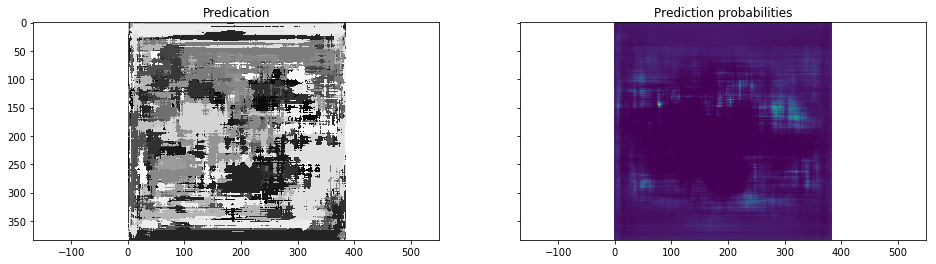

Train step: 100 	Traing Loss: 0.917082 	mIOU: 0.0626461 	Accuracy: 0.440966


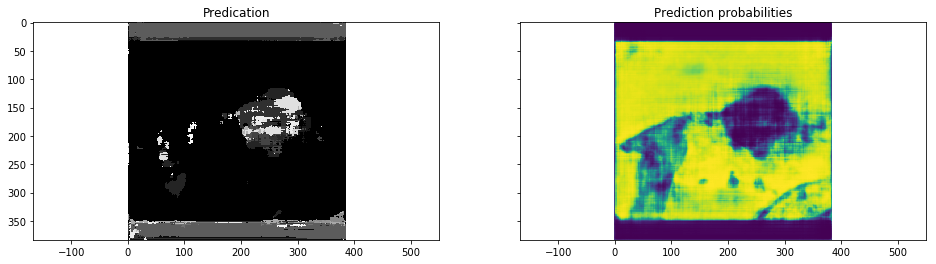

Train step: 200 	Traing Loss: 0.704098 	mIOU: 0.0873677 	Accuracy: 0.49064


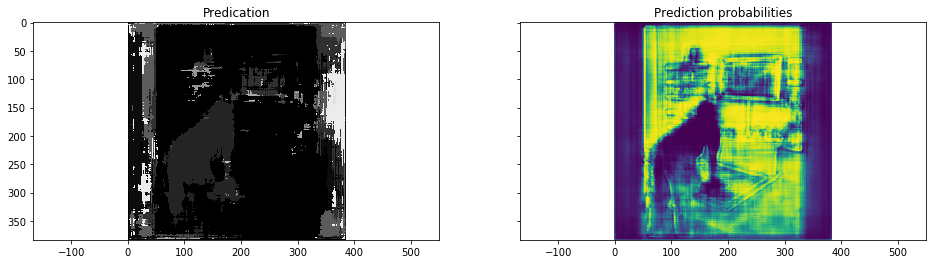

Train step: 300 	Traing Loss: 0.515423 	mIOU: 0.106782 	Accuracy: 0.509368


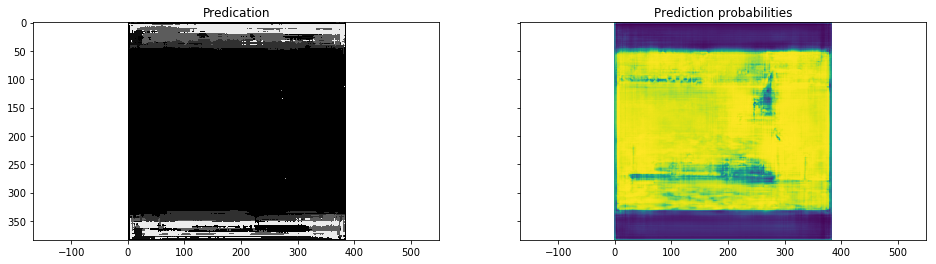

Train step: 400 	Traing Loss: 0.84677 	mIOU: 0.124729 	Accuracy: 0.524102


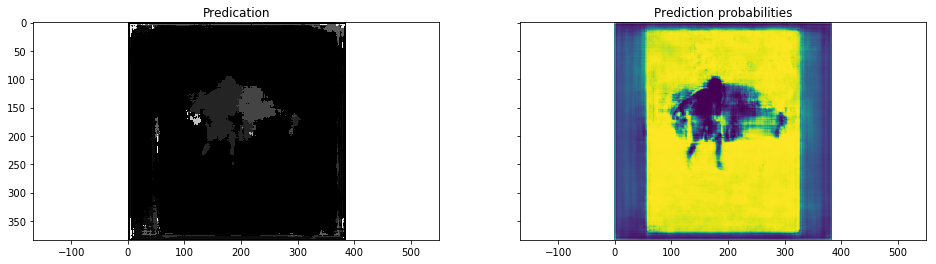

Train step: 500 	Traing Loss: 0.79778 	mIOU: 0.140097 	Accuracy: 0.533997


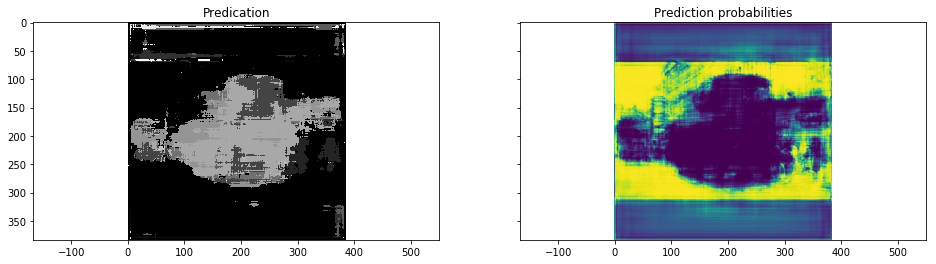

Train step: 600 	Traing Loss: 0.479744 	mIOU: 0.154067 	Accuracy: 0.539775


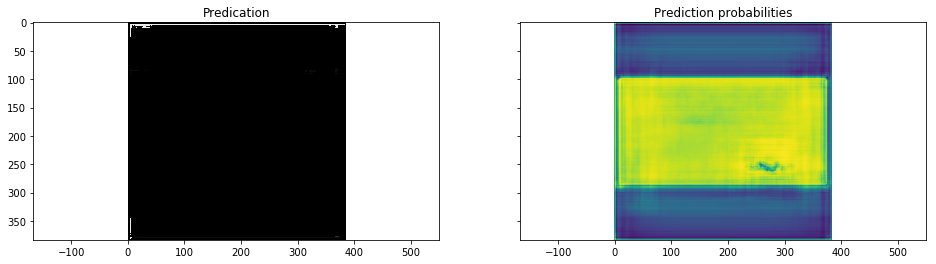

Train step: 700 	Traing Loss: 0.551989 	mIOU: 0.167589 	Accuracy: 0.545938


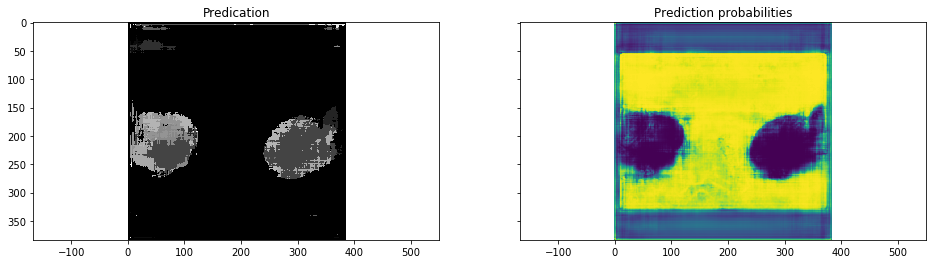

Train step: 800 	Traing Loss: 0.702776 	mIOU: 0.179237 	Accuracy: 0.550919


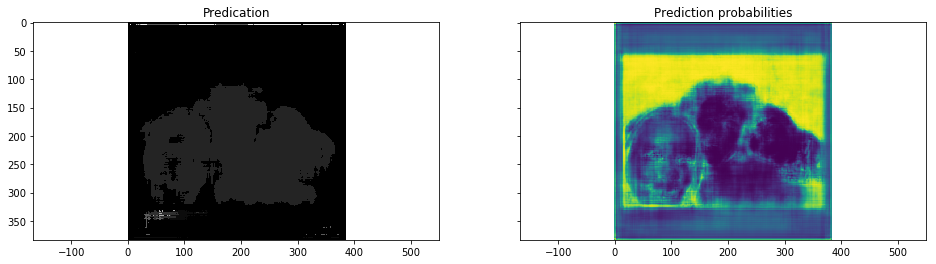

Train step: 900 	Traing Loss: 0.619692 	mIOU: 0.191016 	Accuracy: 0.554492


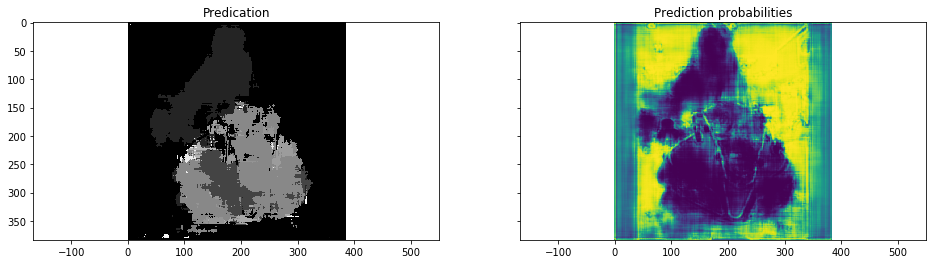

Train step: 1000 	Traing Loss: 0.547796 	mIOU: 0.201757 	Accuracy: 0.55894


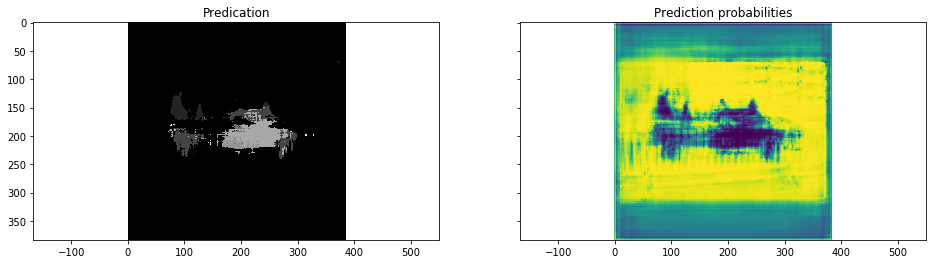

Train step: 1100 	Traing Loss: 0.487445 	mIOU: 0.211314 	Accuracy: 0.561944


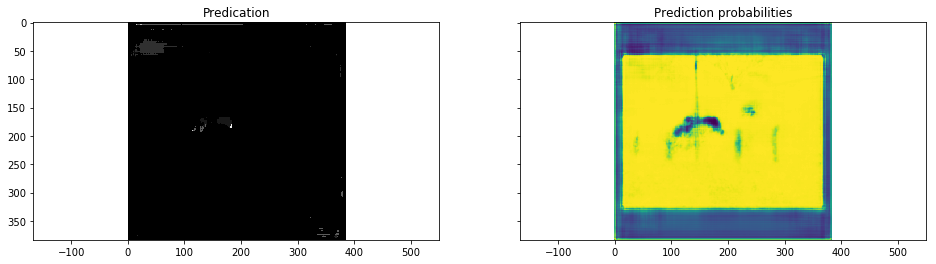

Train step: 1200 	Traing Loss: 0.524432 	mIOU: 0.220794 	Accuracy: 0.564012


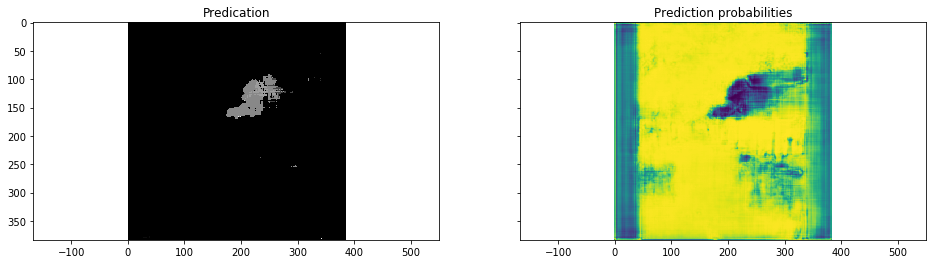

Train step: 1300 	Traing Loss: 0.599327 	mIOU: 0.229822 	Accuracy: 0.56657


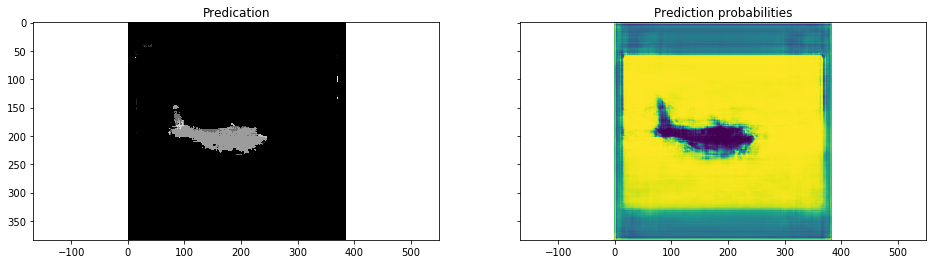

Train step: 1400 	Traing Loss: 0.379925 	mIOU: 0.238549 	Accuracy: 0.569121


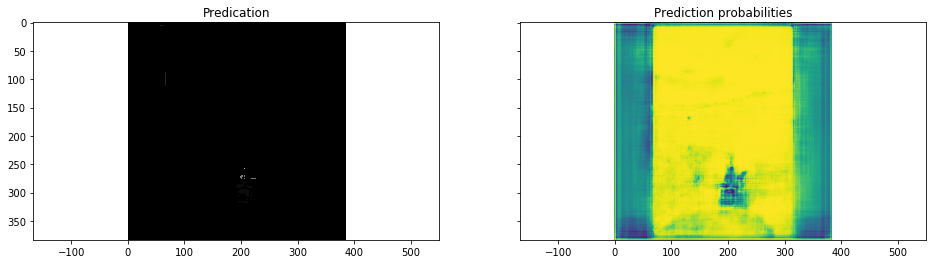

Train step: 1500 	Traing Loss: 0.508311 	mIOU: 0.246566 	Accuracy: 0.570956


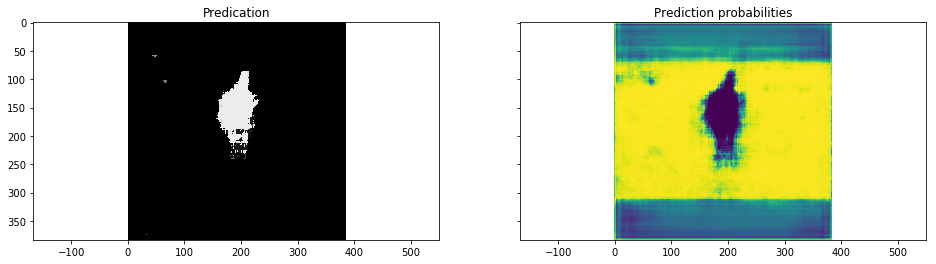

Train step: 1600 	Traing Loss: 0.601832 	mIOU: 0.254439 	Accuracy: 0.572831


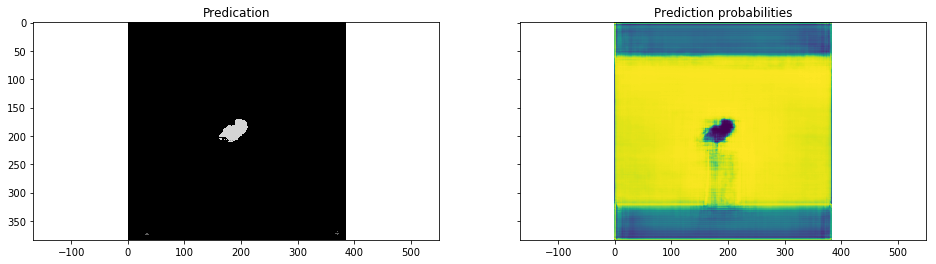

Train step: 1700 	Traing Loss: 0.383387 	mIOU: 0.262224 	Accuracy: 0.575017


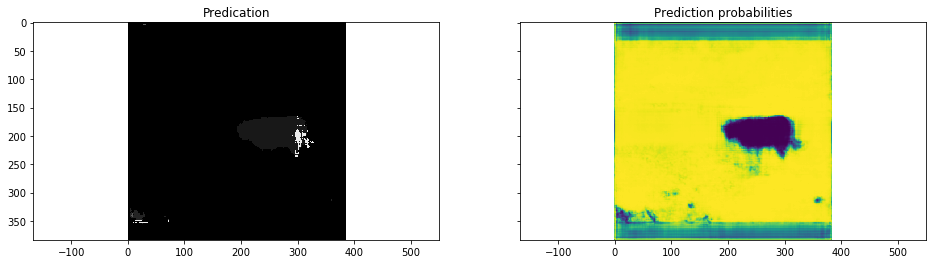

Train step: 1800 	Traing Loss: 0.417967 	mIOU: 0.26937 	Accuracy: 0.576727


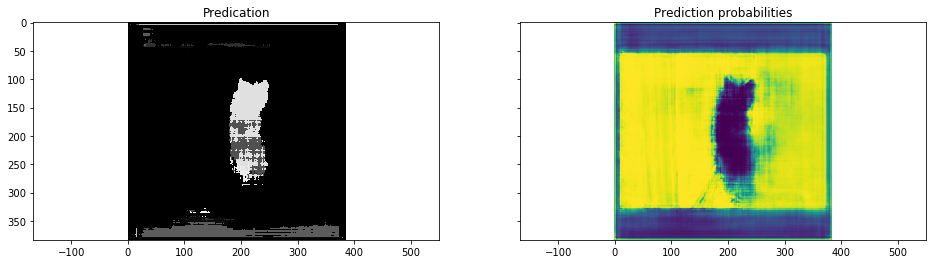

Train step: 1900 	Traing Loss: 0.543276 	mIOU: 0.276462 	Accuracy: 0.578316


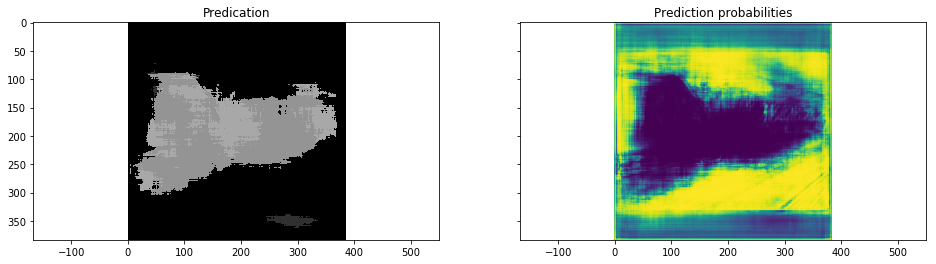

Train step: 2000 	Traing Loss: 0.414477 	mIOU: 0.283904 	Accuracy: 0.580039


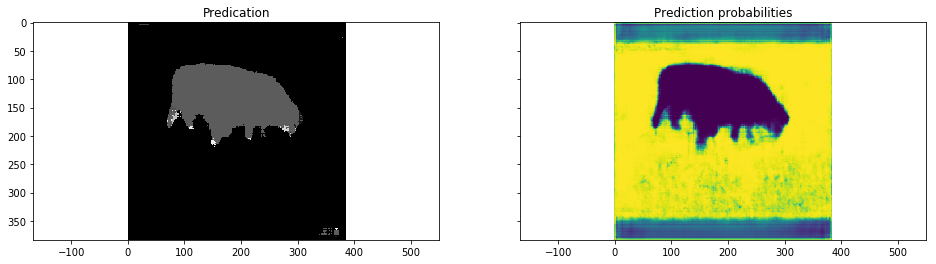

Train step: 2100 	Traing Loss: 0.407705 	mIOU: 0.289739 	Accuracy: 0.58139


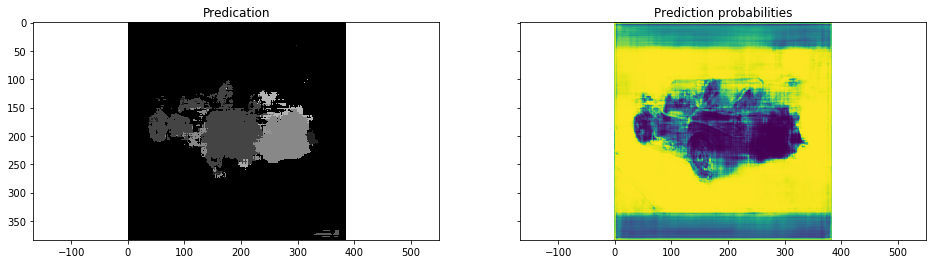

Train step: 2200 	Traing Loss: 0.656909 	mIOU: 0.296168 	Accuracy: 0.582599


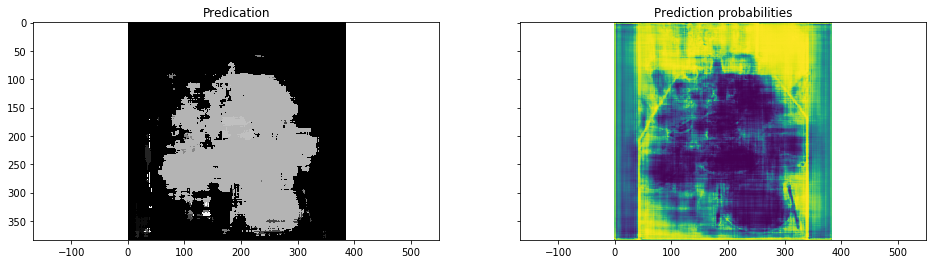

Train step: 2300 	Traing Loss: 0.60223 	mIOU: 0.302792 	Accuracy: 0.584178


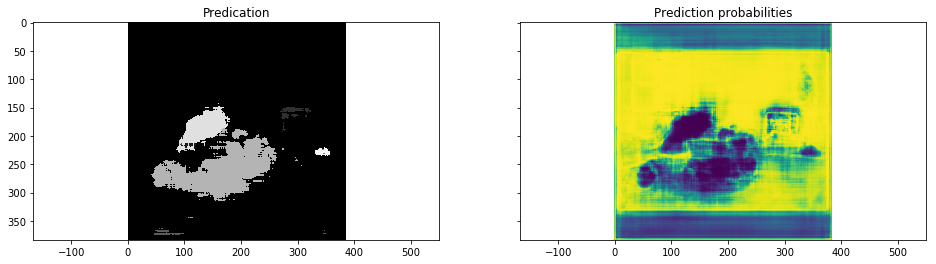

Train step: 2400 	Traing Loss: 0.524774 	mIOU: 0.308396 	Accuracy: 0.585438


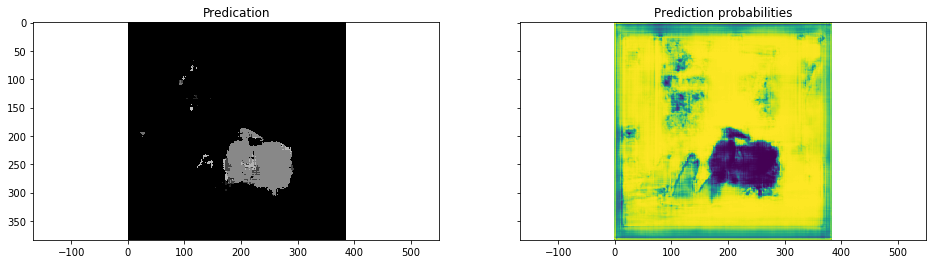

Train step: 2500 	Traing Loss: 0.276646 	mIOU: 0.314233 	Accuracy: 0.586555


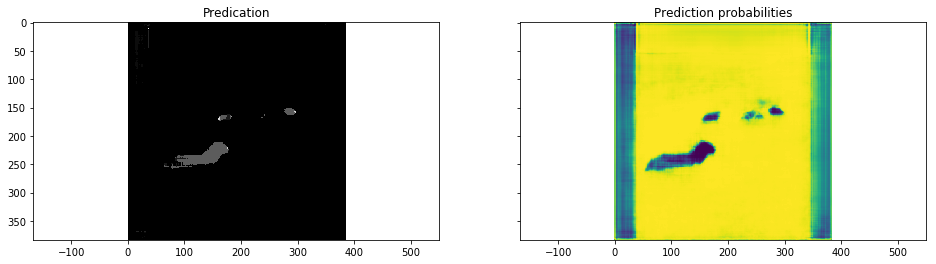

Train step: 2600 	Traing Loss: 0.429998 	mIOU: 0.320194 	Accuracy: 0.587946


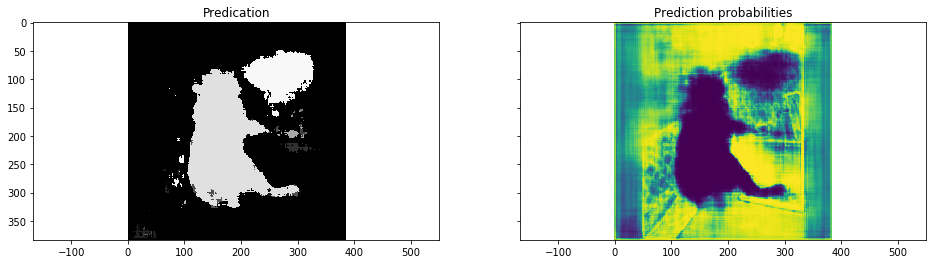

Train step: 2700 	Traing Loss: 0.223808 	mIOU: 0.325398 	Accuracy: 0.589215


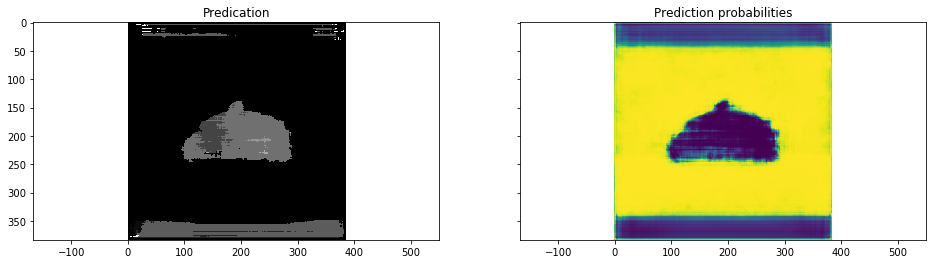

Train step: 2800 	Traing Loss: 0.472423 	mIOU: 0.330655 	Accuracy: 0.590076


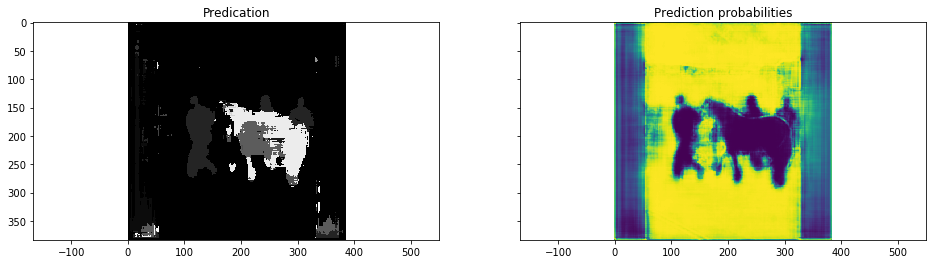

Train step: 2900 	Traing Loss: 0.560522 	mIOU: 0.336068 	Accuracy: 0.591264


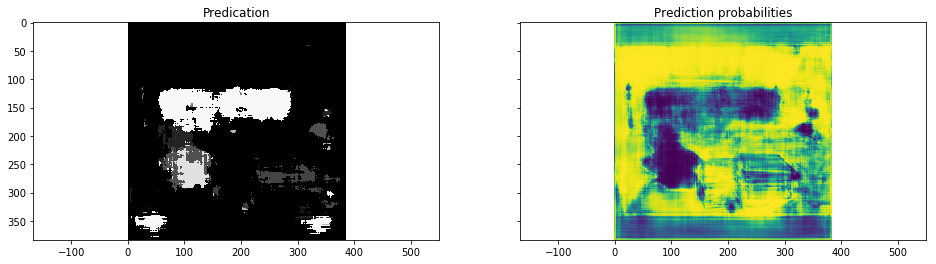

Train step: 3000 	Traing Loss: 0.303665 	mIOU: 0.34099 	Accuracy: 0.592314


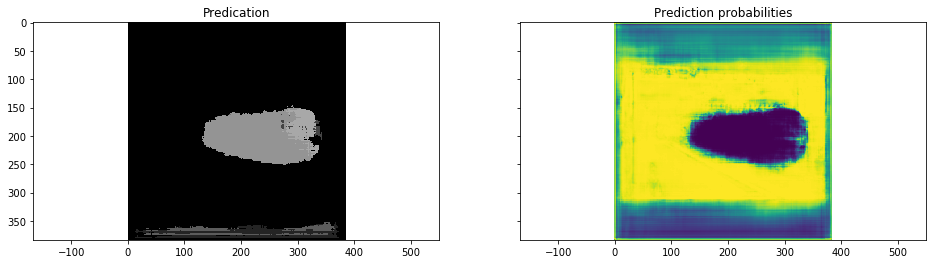

Train step: 3100 	Traing Loss: 0.266461 	mIOU: 0.345723 	Accuracy: 0.593148


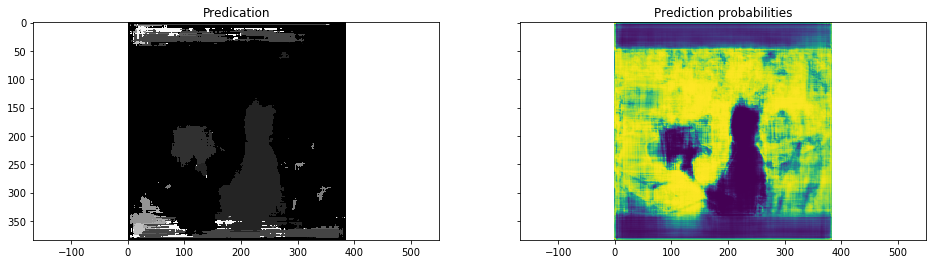

Train step: 3200 	Traing Loss: 0.537776 	mIOU: 0.350784 	Accuracy: 0.594226


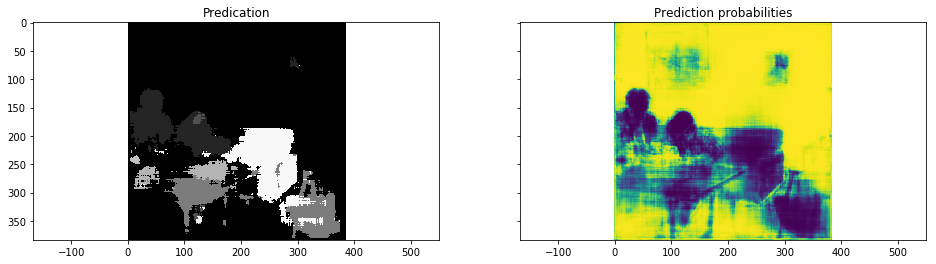

Train step: 3300 	Traing Loss: 0.42284 	mIOU: 0.355412 	Accuracy: 0.595248


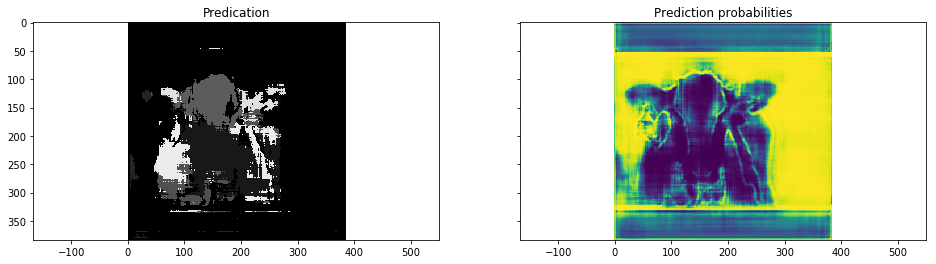

Train step: 3400 	Traing Loss: 0.269019 	mIOU: 0.359957 	Accuracy: 0.596093


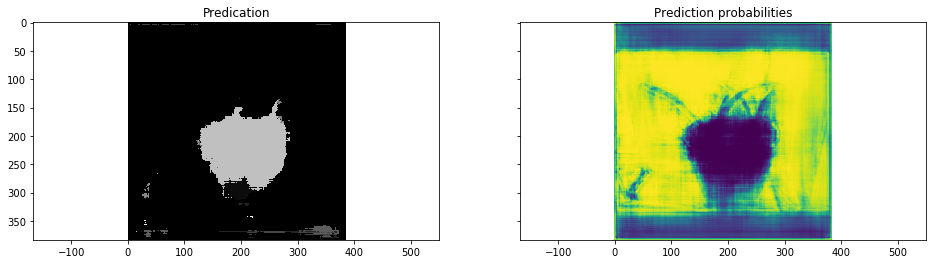

Train step: 3500 	Traing Loss: 0.334269 	mIOU: 0.364737 	Accuracy: 0.597094


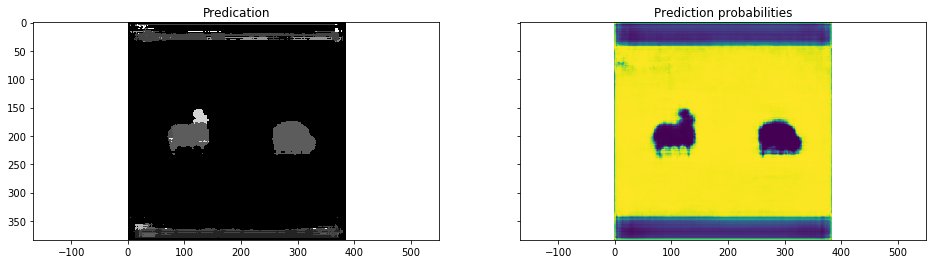

Train step: 3600 	Traing Loss: 0.408468 	mIOU: 0.36921 	Accuracy: 0.598079


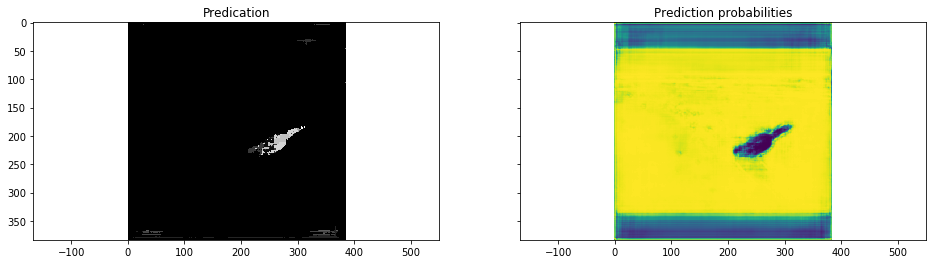

Train step: 3700 	Traing Loss: 0.283077 	mIOU: 0.373221 	Accuracy: 0.598838


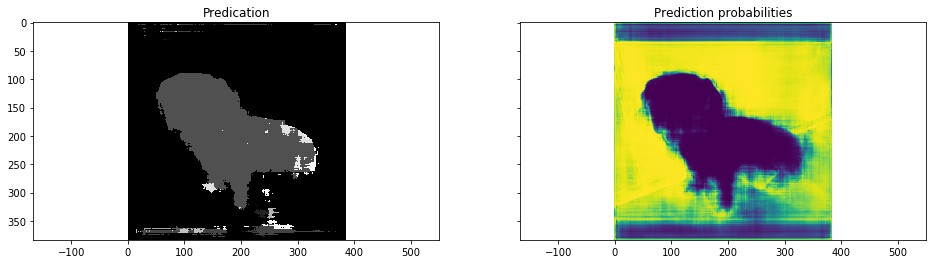

Train step: 3800 	Traing Loss: 0.295351 	mIOU: 0.377644 	Accuracy: 0.599662


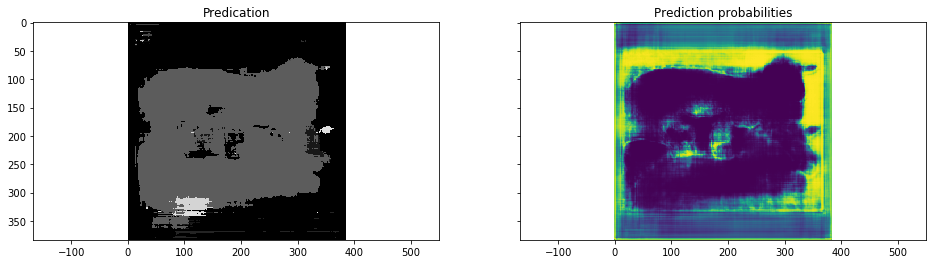

Train step: 3900 	Traing Loss: 0.337633 	mIOU: 0.381911 	Accuracy: 0.600478


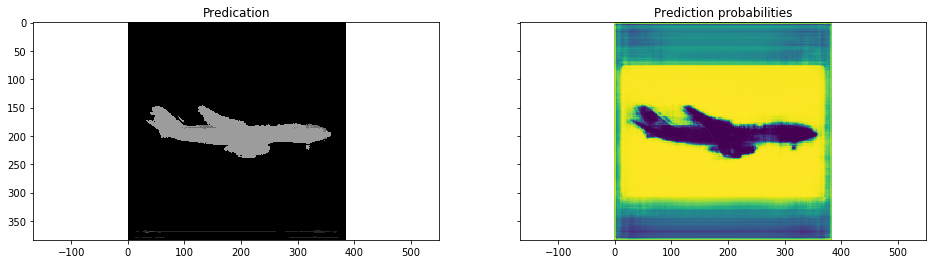

Train step: 4000 	Traing Loss: 0.418212 	mIOU: 0.385647 	Accuracy: 0.601267


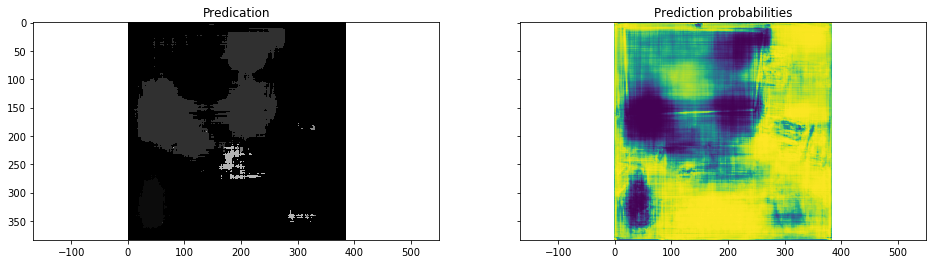

Train step: 4100 	Traing Loss: 0.361886 	mIOU: 0.389922 	Accuracy: 0.601979


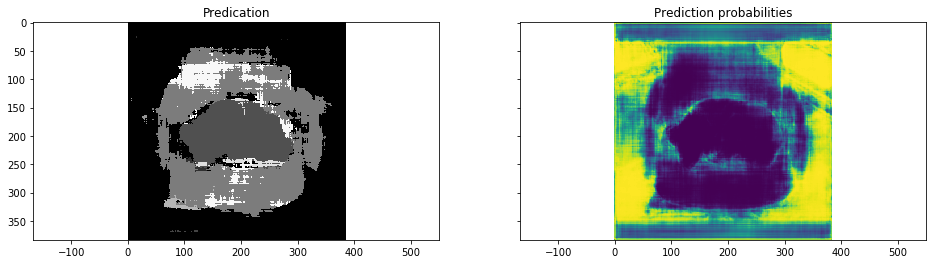

Train step: 4200 	Traing Loss: 0.245774 	mIOU: 0.394138 	Accuracy: 0.602911


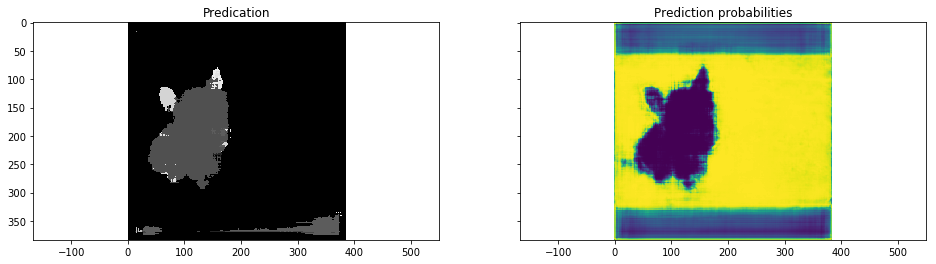

Train step: 4300 	Traing Loss: 0.277586 	mIOU: 0.397728 	Accuracy: 0.603631


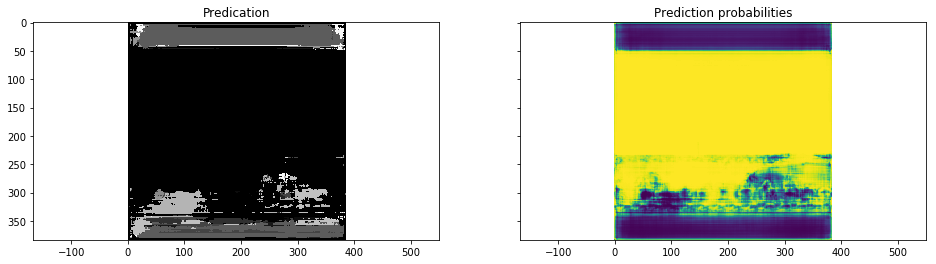

Train step: 4400 	Traing Loss: 0.335064 	mIOU: 0.401677 	Accuracy: 0.604353


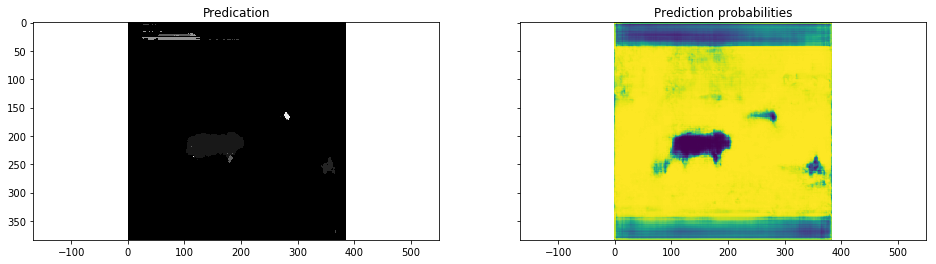

Train step: 4500 	Traing Loss: 0.322623 	mIOU: 0.405601 	Accuracy: 0.605151


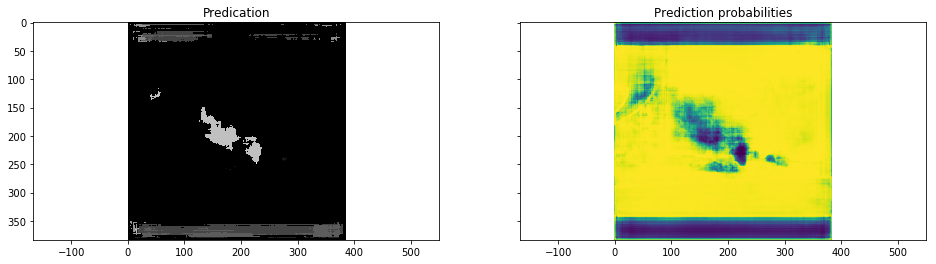

Train step: 4600 	Traing Loss: 0.282274 	mIOU: 0.409204 	Accuracy: 0.605869


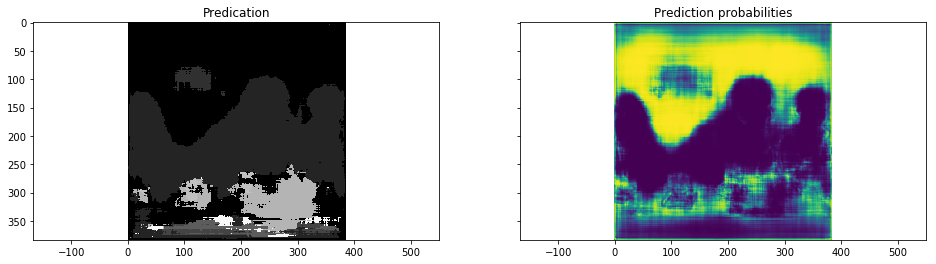

Train step: 4700 	Traing Loss: 0.259179 	mIOU: 0.412939 	Accuracy: 0.60653


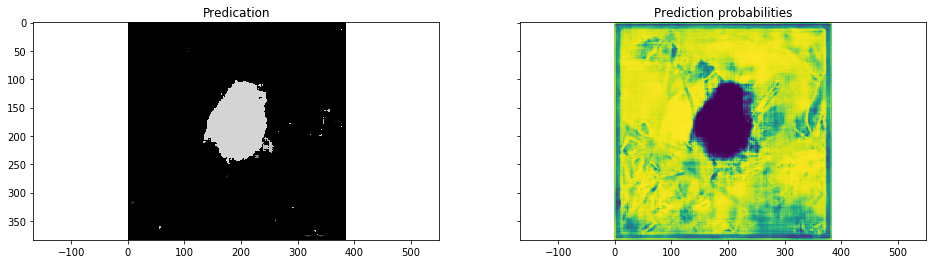

Train step: 4800 	Traing Loss: 0.253424 	mIOU: 0.416804 	Accuracy: 0.607294


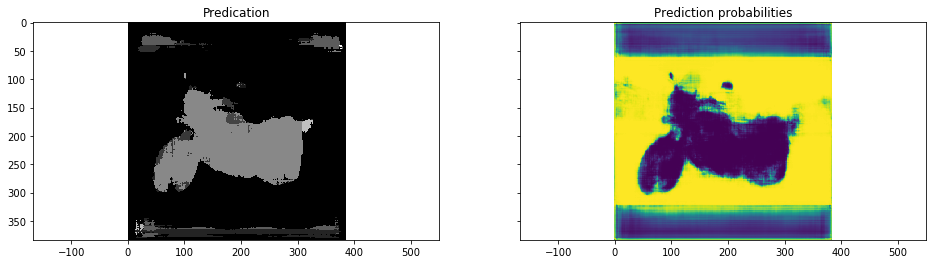

Train step: 4900 	Traing Loss: 0.306841 	mIOU: 0.420244 	Accuracy: 0.60802


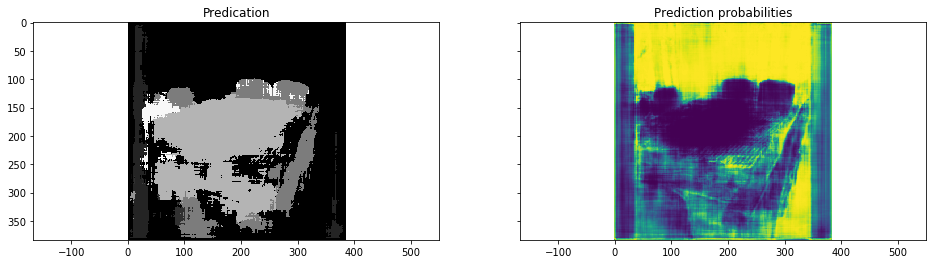

Train step: 5000 	Traing Loss: 0.289922 	mIOU: 0.423798 	Accuracy: 0.608623


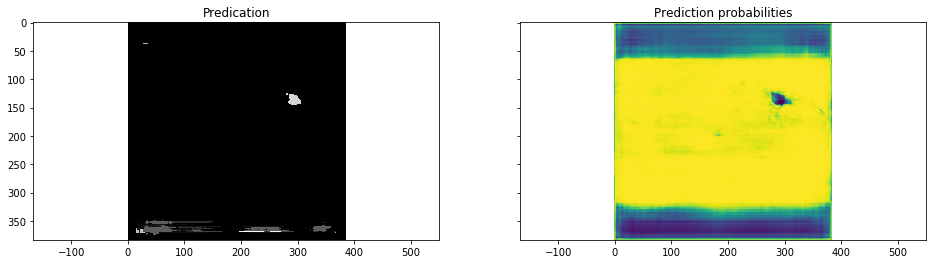

Train step: 5100 	Traing Loss: 0.242206 	mIOU: 0.427424 	Accuracy: 0.609364


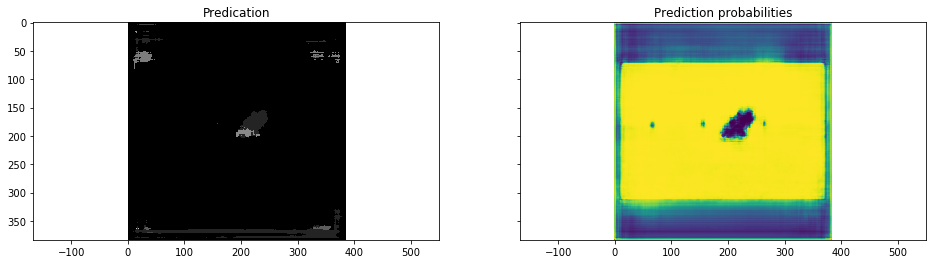

Train step: 5200 	Traing Loss: 0.206878 	mIOU: 0.430805 	Accuracy: 0.610036


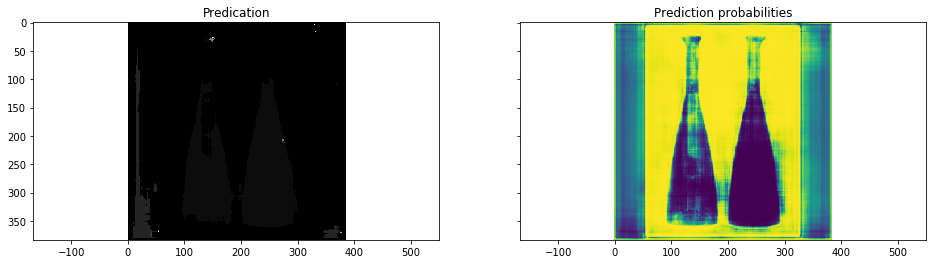

Train step: 5300 	Traing Loss: 0.305574 	mIOU: 0.434118 	Accuracy: 0.610737


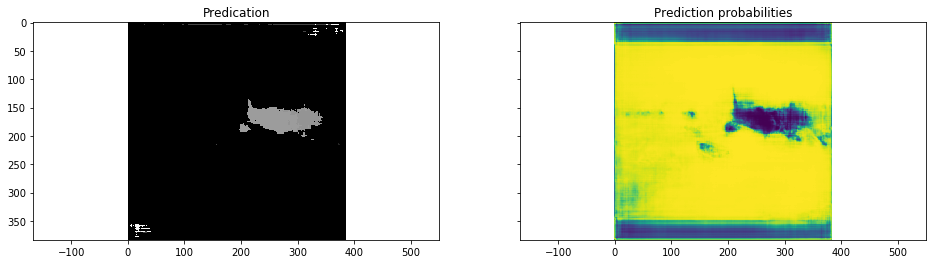

Train step: 5400 	Traing Loss: 0.484355 	mIOU: 0.437663 	Accuracy: 0.611416


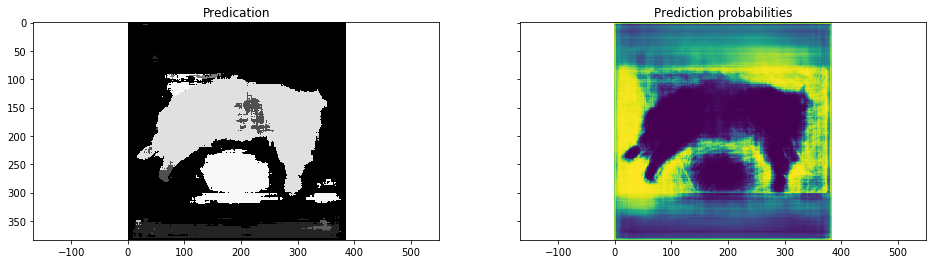

Train step: 5500 	Traing Loss: 0.295099 	mIOU: 0.440841 	Accuracy: 0.612076


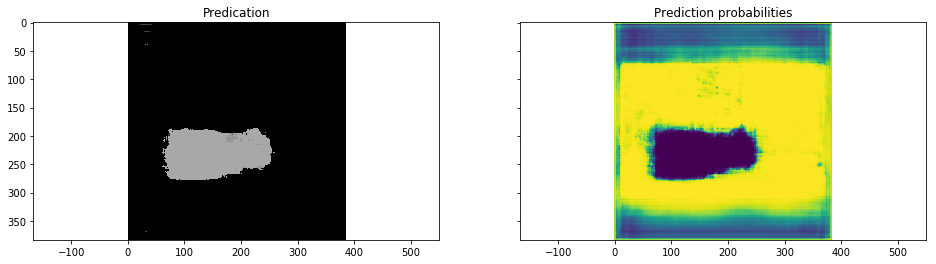

Train step: 5600 	Traing Loss: 0.3275 	mIOU: 0.443955 	Accuracy: 0.612633


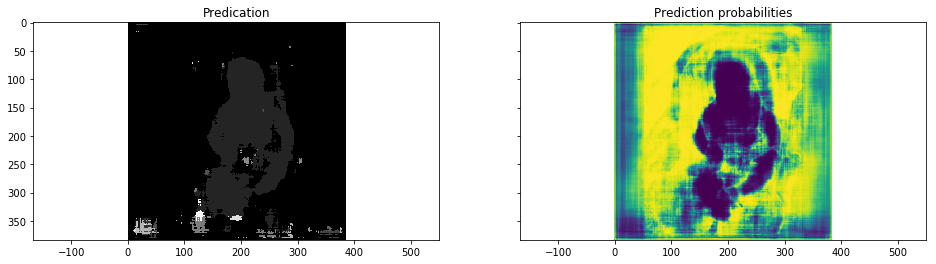

Train step: 5700 	Traing Loss: 0.365844 	mIOU: 0.447391 	Accuracy: 0.613315


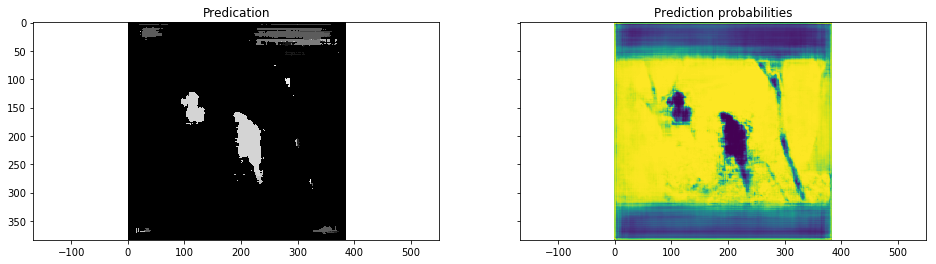

Train step: 5800 	Traing Loss: 0.405292 	mIOU: 0.450588 	Accuracy: 0.613946


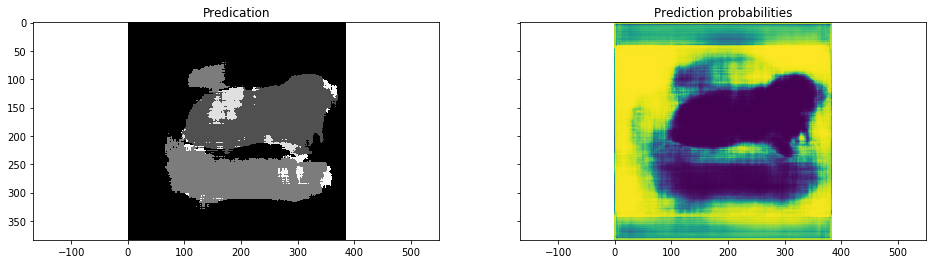

Train step: 5900 	Traing Loss: 0.205843 	mIOU: 0.453457 	Accuracy: 0.614514


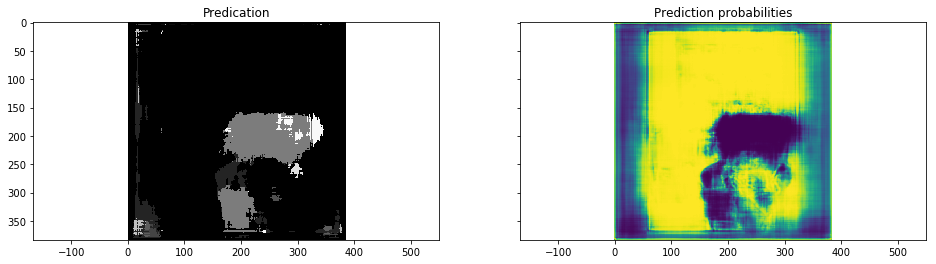

Train step: 6000 	Traing Loss: 0.50676 	mIOU: 0.456786 	Accuracy: 0.615114


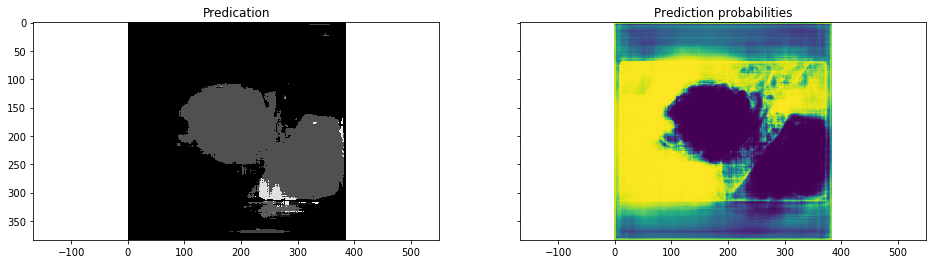

Train step: 6100 	Traing Loss: 0.269967 	mIOU: 0.459968 	Accuracy: 0.615747


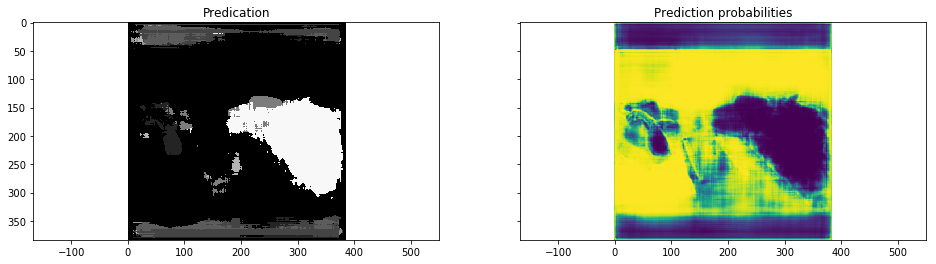

Train step: 6200 	Traing Loss: 0.226127 	mIOU: 0.462766 	Accuracy: 0.61631


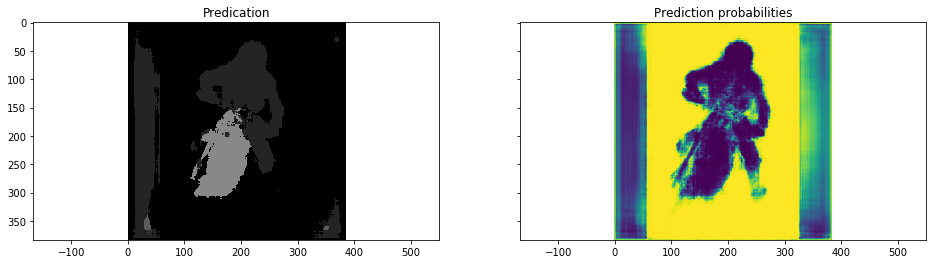

Train step: 6300 	Traing Loss: 0.309987 	mIOU: 0.465979 	Accuracy: 0.61683


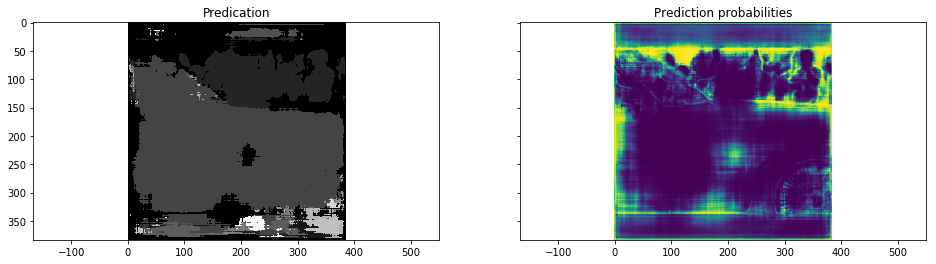

Train step: 6400 	Traing Loss: 0.351636 	mIOU: 0.468988 	Accuracy: 0.617352


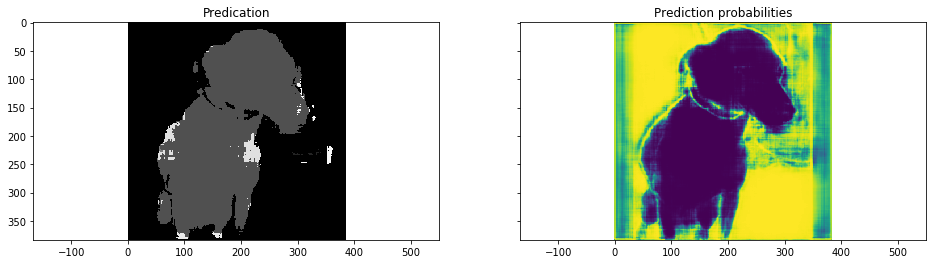

Train step: 6500 	Traing Loss: 0.158394 	mIOU: 0.471756 	Accuracy: 0.617929


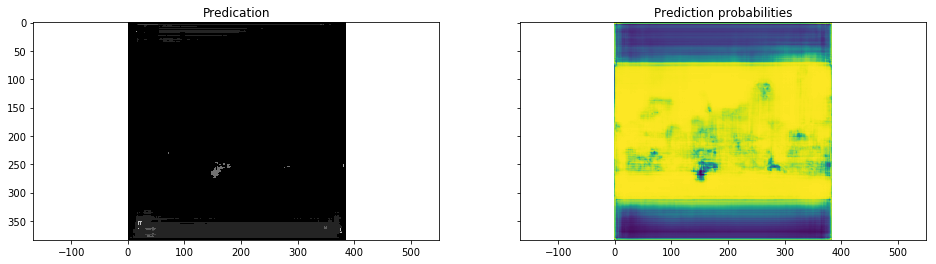

Train step: 6600 	Traing Loss: 0.266336 	mIOU: 0.474734 	Accuracy: 0.618511


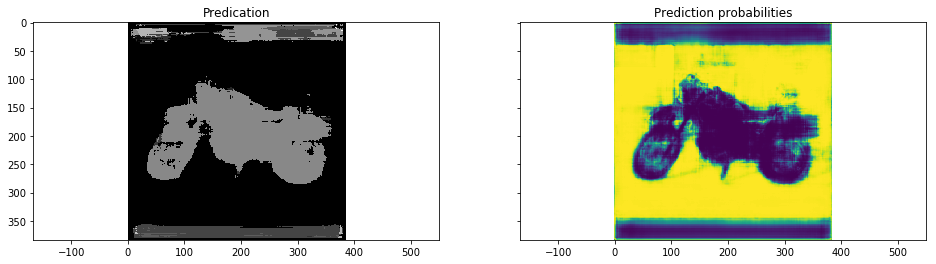

Train step: 6700 	Traing Loss: 0.299778 	mIOU: 0.477727 	Accuracy: 0.619087


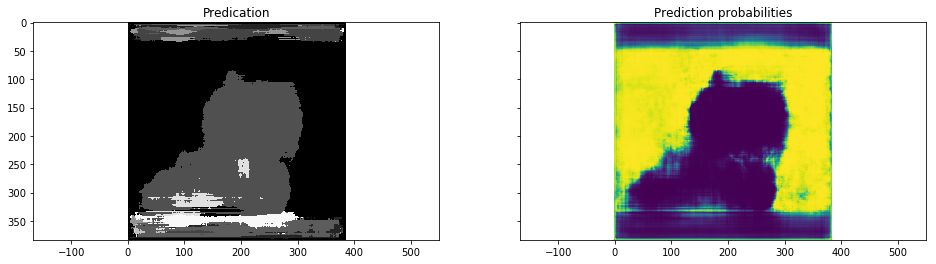

Train step: 6800 	Traing Loss: 0.242247 	mIOU: 0.48047 	Accuracy: 0.619648


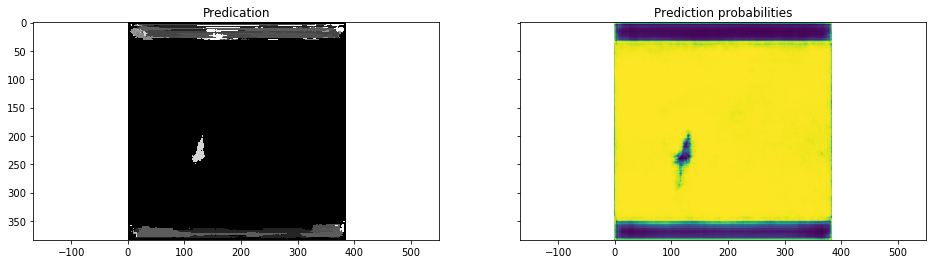

Train step: 6900 	Traing Loss: 0.267933 	mIOU: 0.483364 	Accuracy: 0.62018


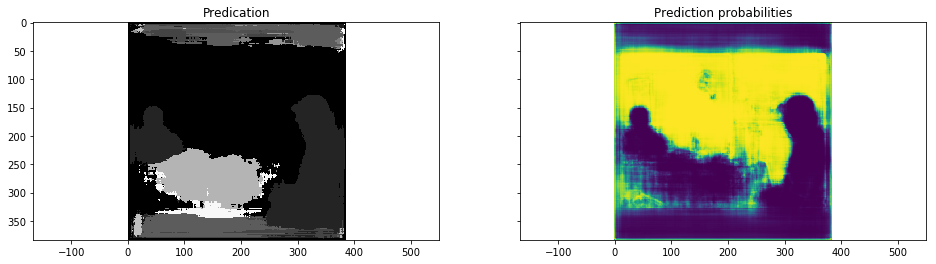

Train step: 7000 	Traing Loss: 0.200298 	mIOU: 0.486271 	Accuracy: 0.620728


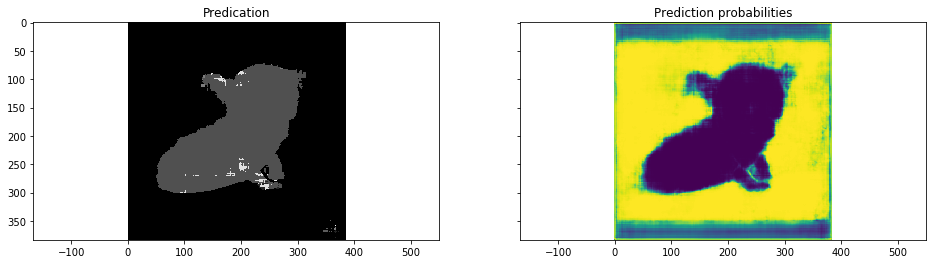

Train step: 7100 	Traing Loss: 0.217808 	mIOU: 0.488923 	Accuracy: 0.621246


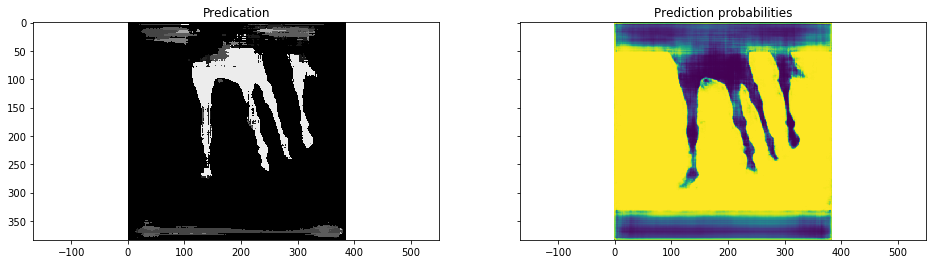

Train step: 7200 	Traing Loss: 0.289946 	mIOU: 0.491662 	Accuracy: 0.621716


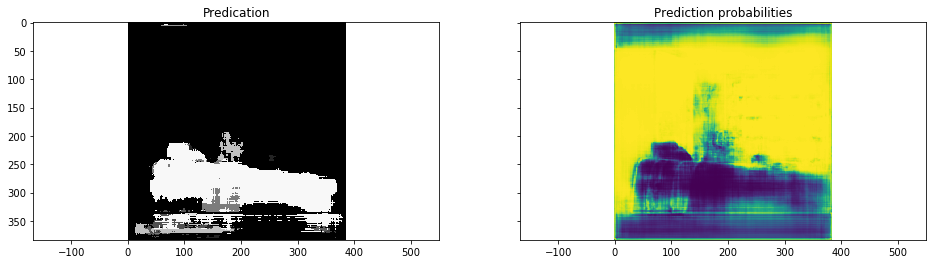

Train step: 7300 	Traing Loss: 0.347864 	mIOU: 0.494468 	Accuracy: 0.622264


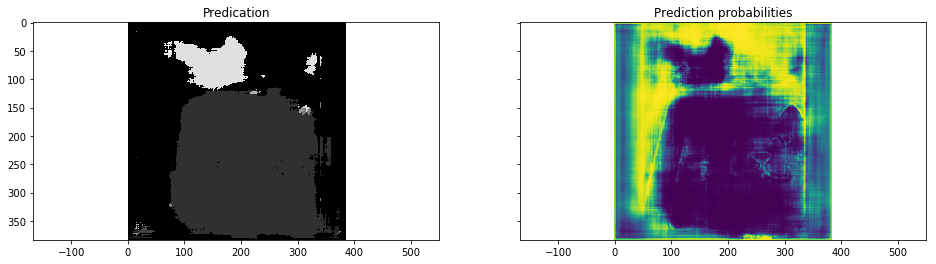

Train step: 7400 	Traing Loss: 0.110755 	mIOU: 0.497042 	Accuracy: 0.622768


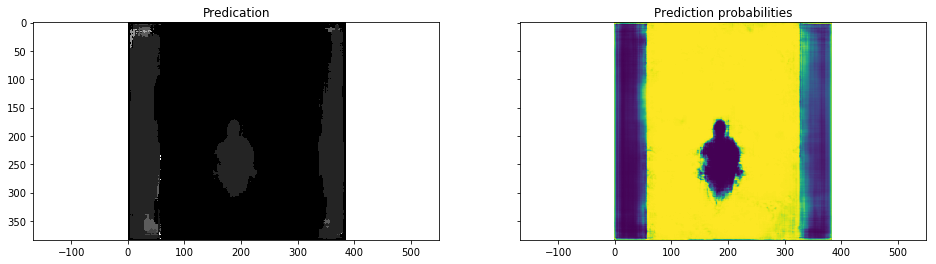

Train step: 7500 	Traing Loss: 0.144285 	mIOU: 0.499635 	Accuracy: 0.623239


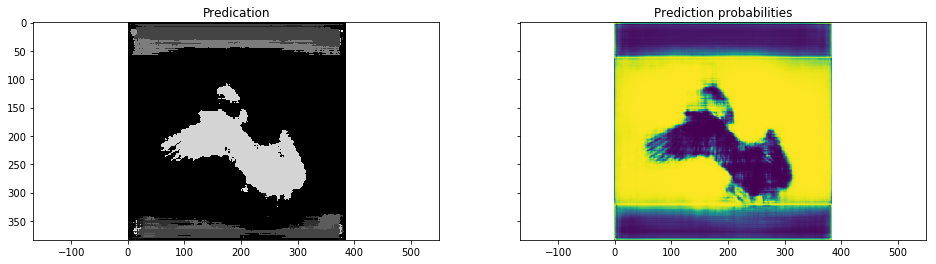

Train step: 7600 	Traing Loss: 0.268357 	mIOU: 0.502366 	Accuracy: 0.623768


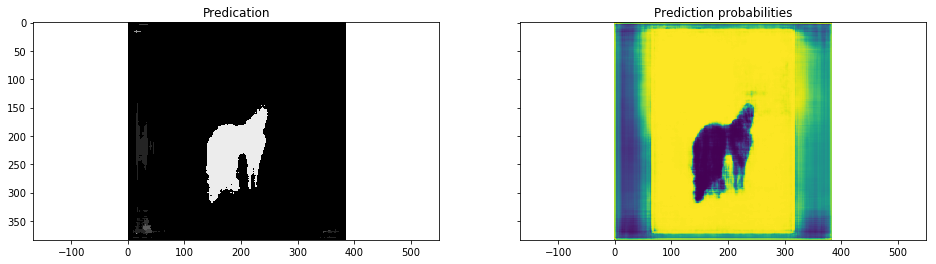

Train step: 7700 	Traing Loss: 0.176853 	mIOU: 0.504914 	Accuracy: 0.624228


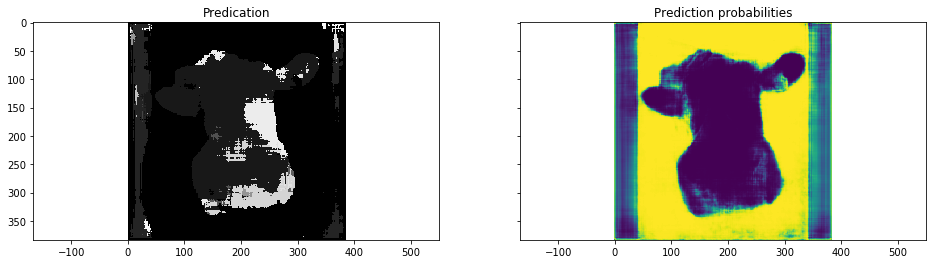

Train step: 7800 	Traing Loss: 0.137309 	mIOU: 0.507268 	Accuracy: 0.624701


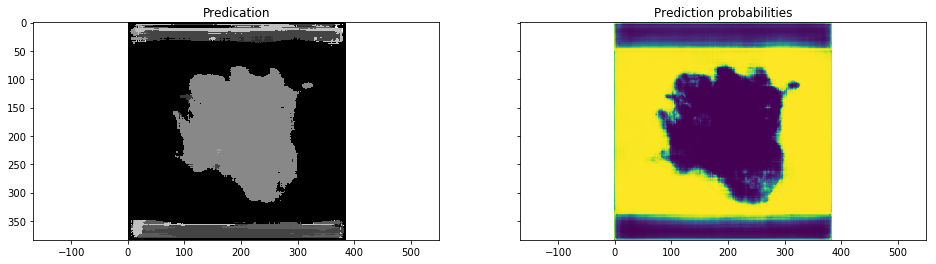

Train step: 7900 	Traing Loss: 0.211338 	mIOU: 0.509904 	Accuracy: 0.625122


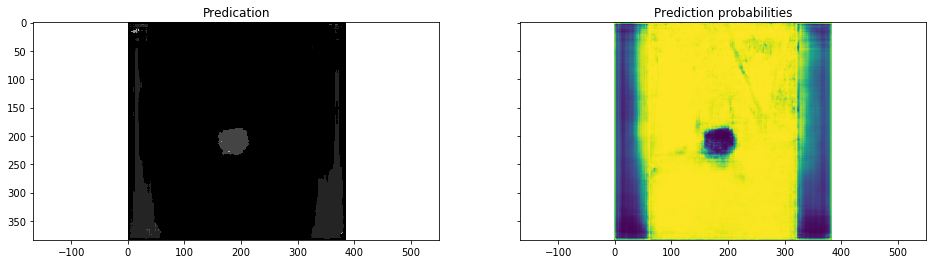

Train step: 8000 	Traing Loss: 0.200258 	mIOU: 0.512435 	Accuracy: 0.625601


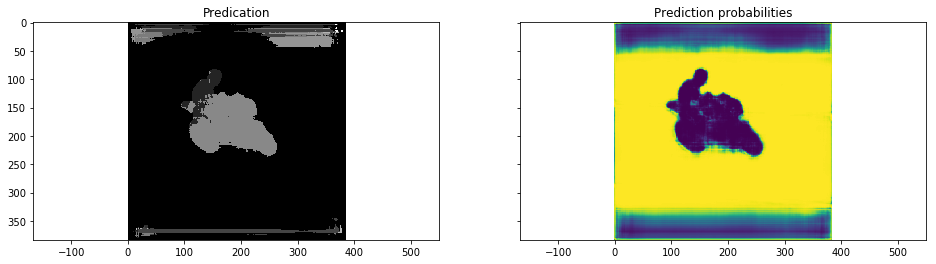

Train step: 8100 	Traing Loss: 0.191248 	mIOU: 0.514706 	Accuracy: 0.626051


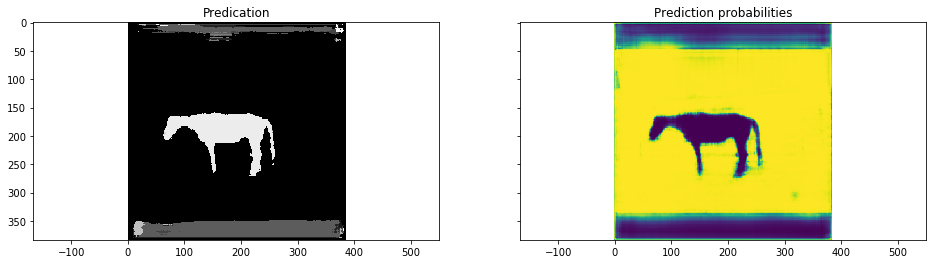

Train step: 8200 	Traing Loss: 0.235246 	mIOU: 0.517272 	Accuracy: 0.626496


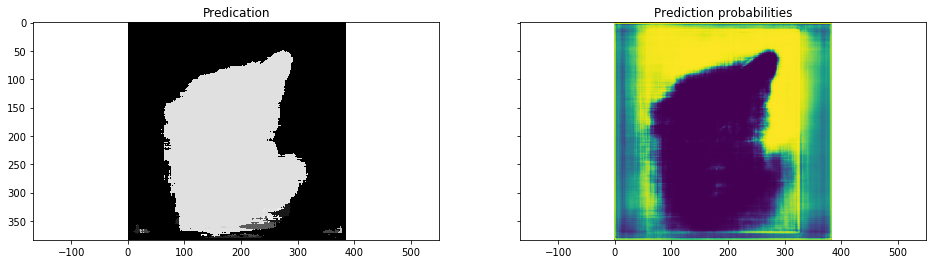

Train step: 8300 	Traing Loss: 0.222589 	mIOU: 0.519706 	Accuracy: 0.62695


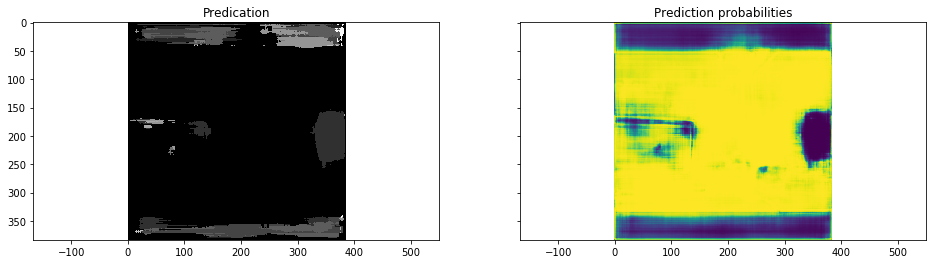

Train step: 8400 	Traing Loss: 0.158744 	mIOU: 0.521939 	Accuracy: 0.627411


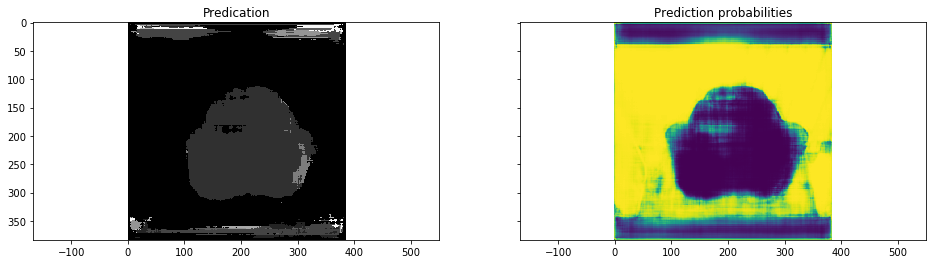

Train step: 8500 	Traing Loss: 0.174025 	mIOU: 0.524404 	Accuracy: 0.627868


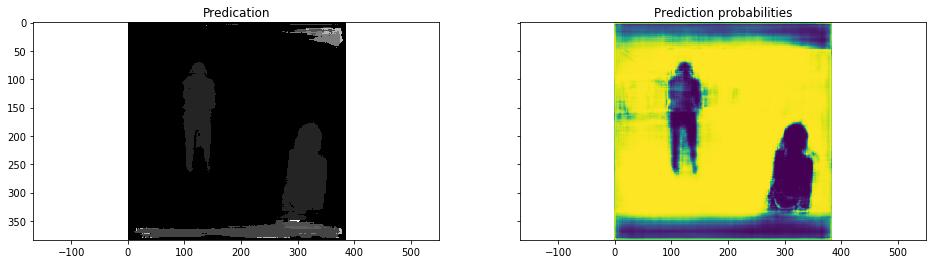

Train step: 8600 	Traing Loss: 0.20101 	mIOU: 0.526813 	Accuracy: 0.628312


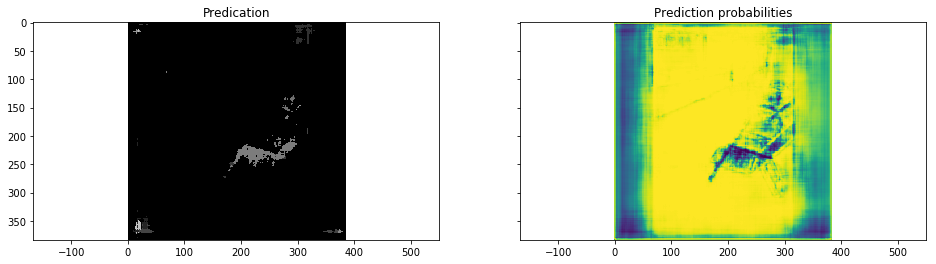

Train step: 8700 	Traing Loss: 0.216536 	mIOU: 0.529071 	Accuracy: 0.628759


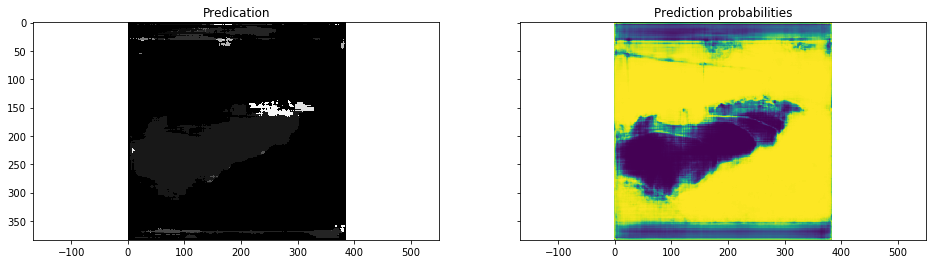

Train step: 8800 	Traing Loss: 0.230357 	mIOU: 0.531399 	Accuracy: 0.629134


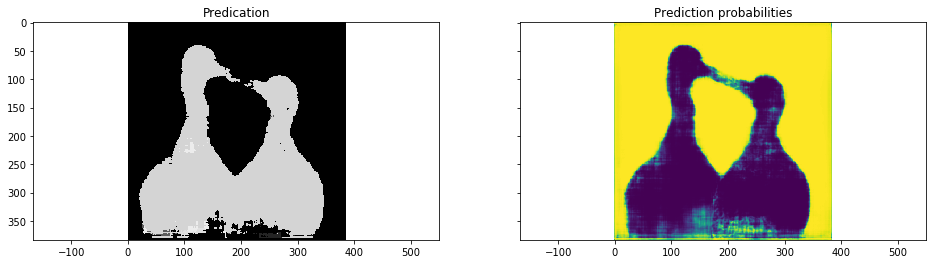

Train step: 8900 	Traing Loss: 0.164726 	mIOU: 0.533755 	Accuracy: 0.629565


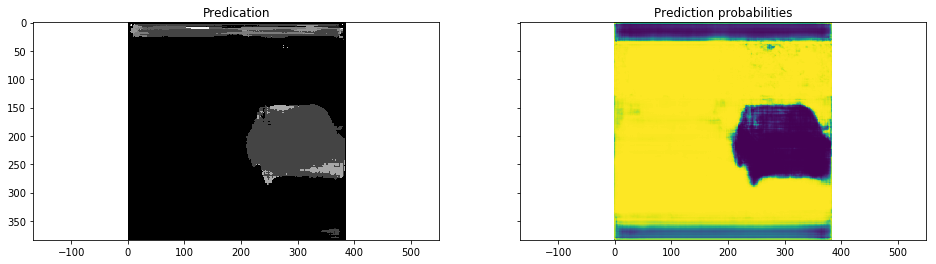

Train step: 9000 	Traing Loss: 0.127687 	mIOU: 0.535885 	Accuracy: 0.629993


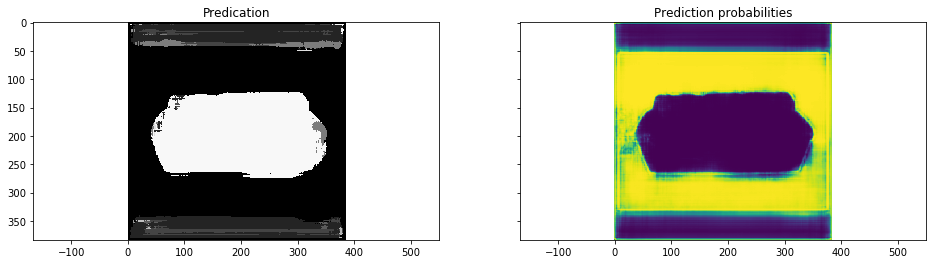

Train step: 9100 	Traing Loss: 0.177984 	mIOU: 0.538157 	Accuracy: 0.63042


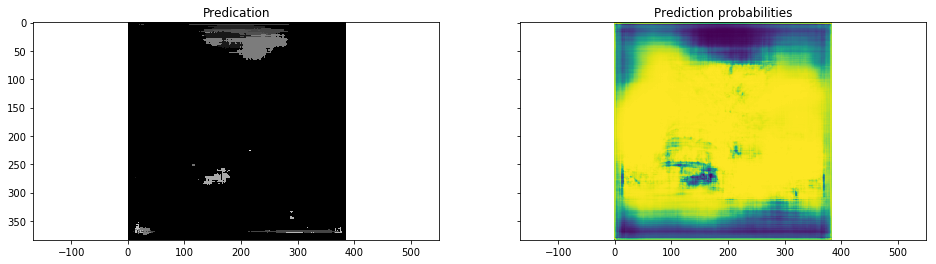

Train step: 9200 	Traing Loss: 0.142331 	mIOU: 0.540429 	Accuracy: 0.630827


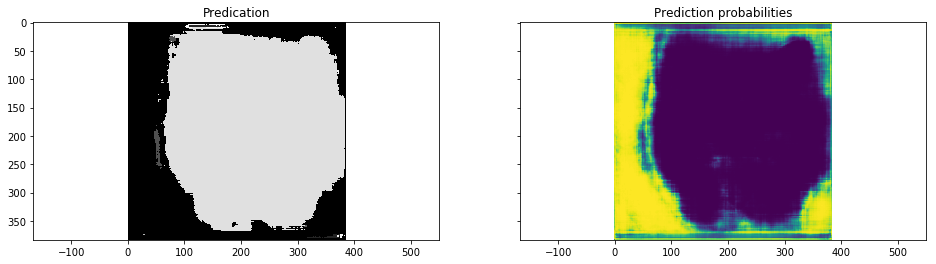

Train step: 9300 	Traing Loss: 0.124068 	mIOU: 0.54252 	Accuracy: 0.631204


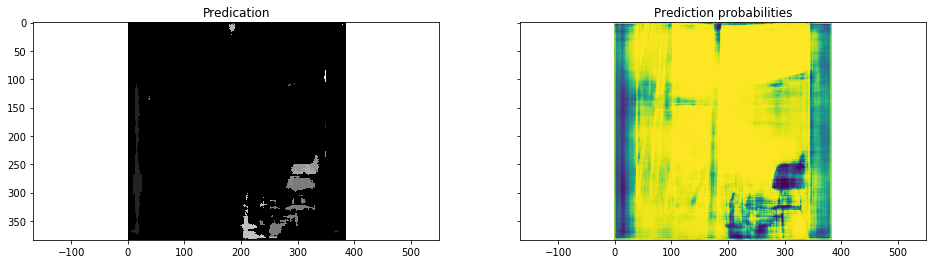

Train step: 9400 	Traing Loss: 0.164753 	mIOU: 0.544713 	Accuracy: 0.631555


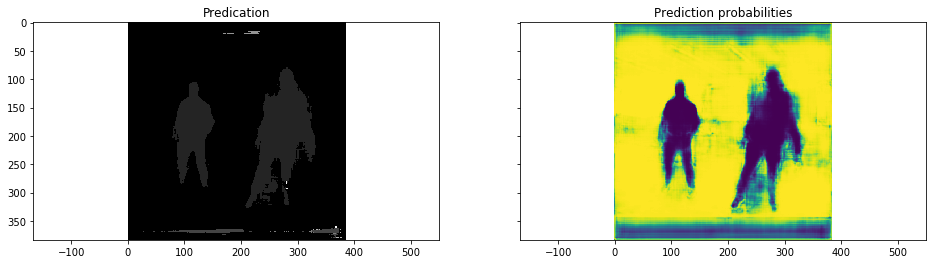

Train step: 9500 	Traing Loss: 0.167587 	mIOU: 0.54693 	Accuracy: 0.631967


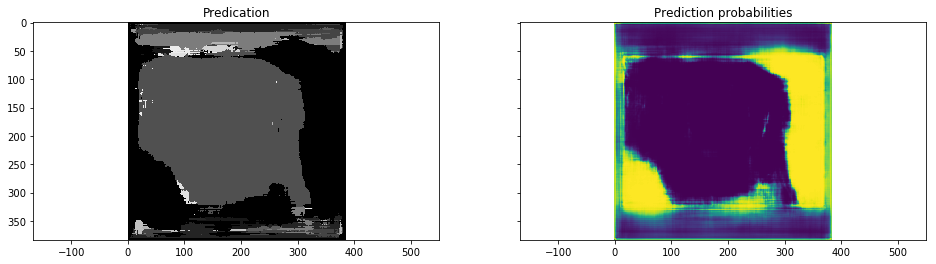

Train step: 9600 	Traing Loss: 0.139067 	mIOU: 0.548969 	Accuracy: 0.632356


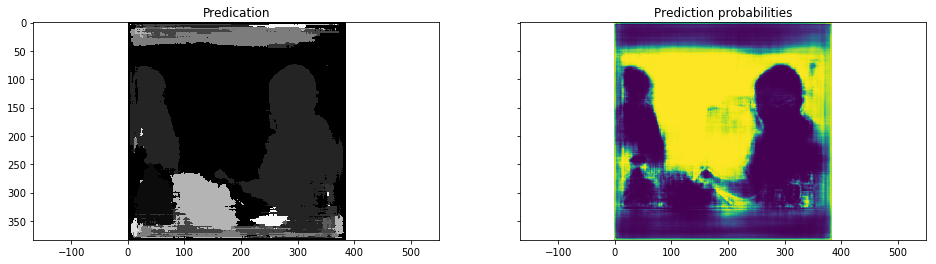

Train step: 9700 	Traing Loss: 0.176263 	mIOU: 0.551045 	Accuracy: 0.632751


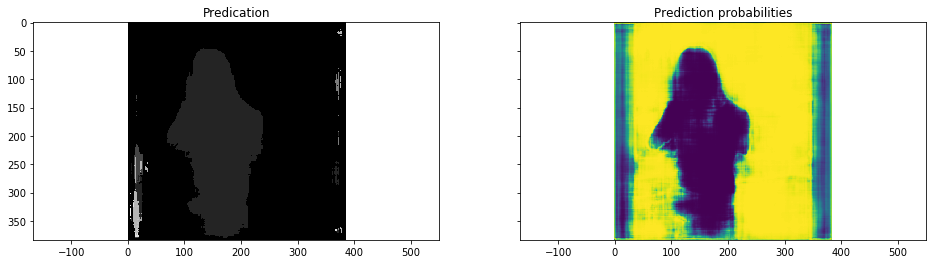

Train step: 9800 	Traing Loss: 0.166371 	mIOU: 0.553221 	Accuracy: 0.633159


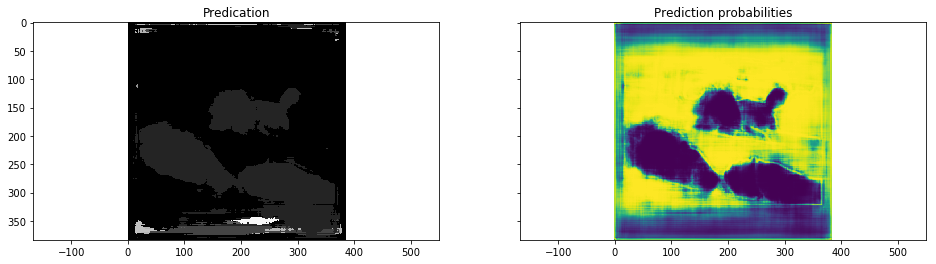

Train step: 9900 	Traing Loss: 0.165516 	mIOU: 0.555287 	Accuracy: 0.633549


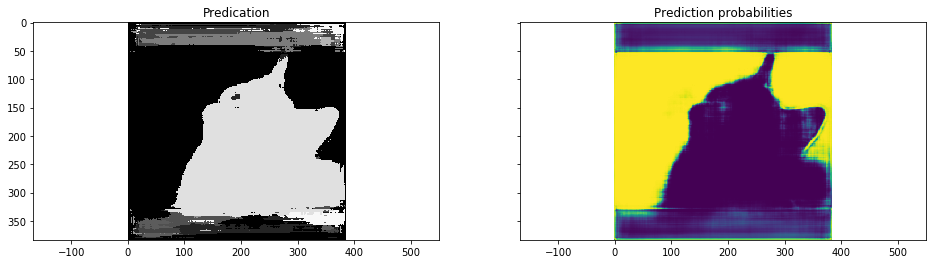

Train step: 10000 	Traing Loss: 0.105089 	mIOU: 0.557194 	Accuracy: 0.63394


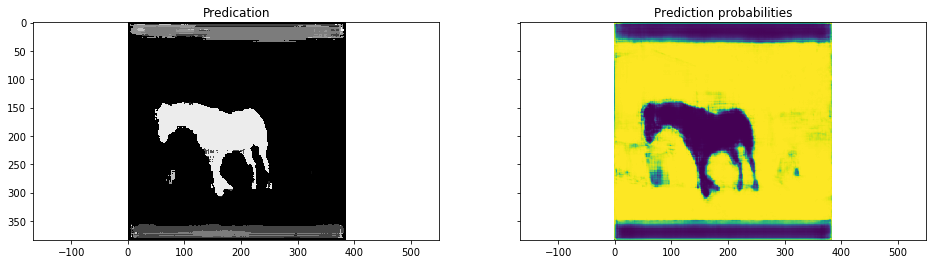

Train step: 10100 	Traing Loss: 0.209697 	mIOU: 0.559322 	Accuracy: 0.634302


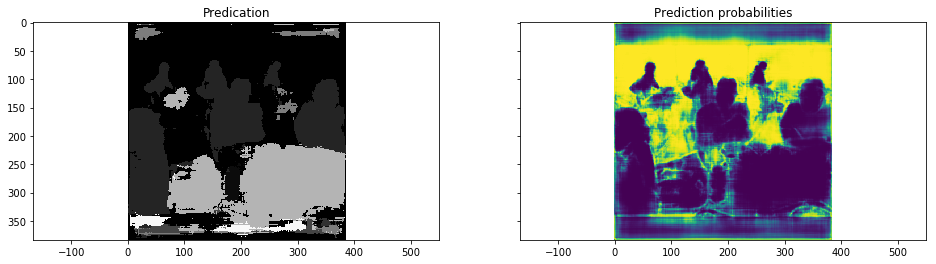

Train step: 10200 	Traing Loss: 0.13075 	mIOU: 0.5613 	Accuracy: 0.63464


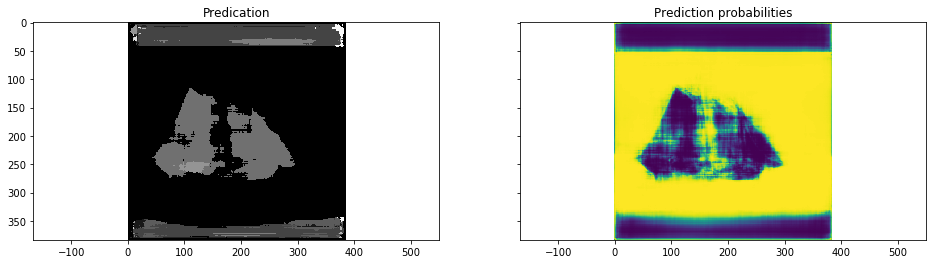

Train step: 10300 	Traing Loss: 0.177542 	mIOU: 0.563122 	Accuracy: 0.634986


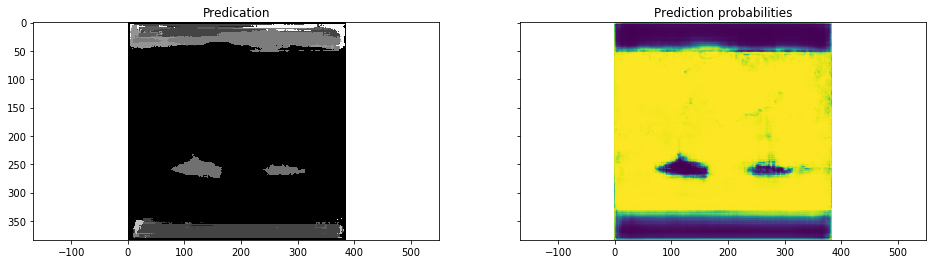

Train step: 10400 	Traing Loss: 0.150628 	mIOU: 0.565183 	Accuracy: 0.635364


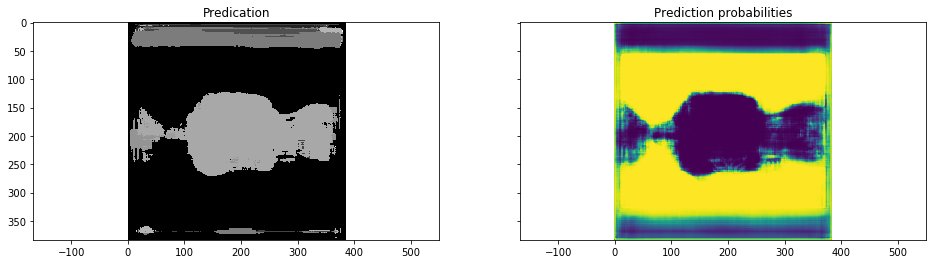

Train step: 10500 	Traing Loss: 0.183861 	mIOU: 0.567098 	Accuracy: 0.635712


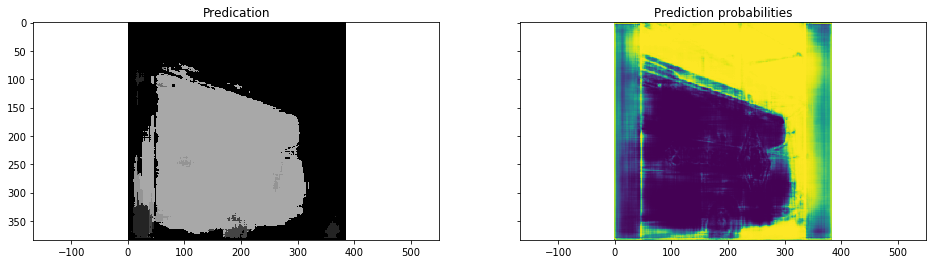

Train step: 10600 	Traing Loss: 0.0865086 	mIOU: 0.56891 	Accuracy: 0.636057


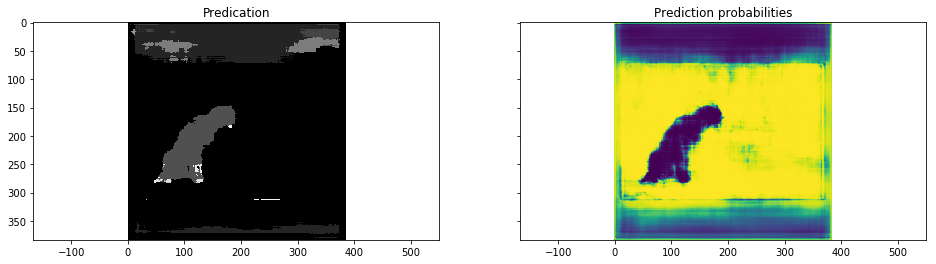

Train step: 10700 	Traing Loss: 0.194062 	mIOU: 0.570852 	Accuracy: 0.636396


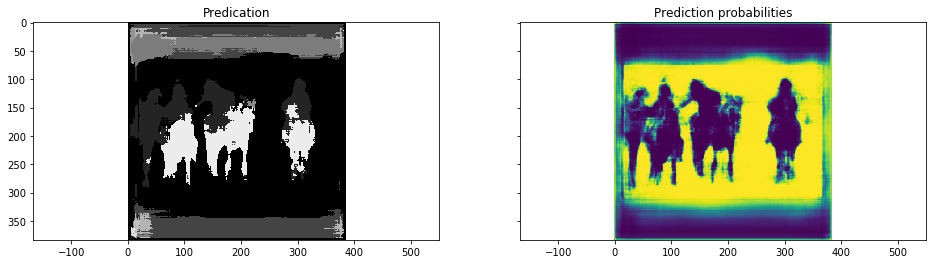

Train step: 10800 	Traing Loss: 0.147881 	mIOU: 0.572772 	Accuracy: 0.636748


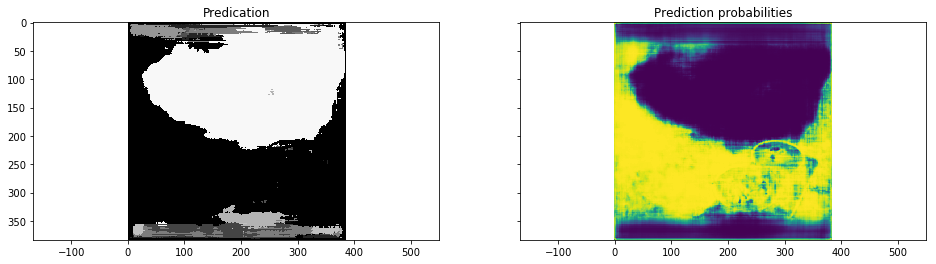

Train step: 10900 	Traing Loss: 0.109096 	mIOU: 0.574541 	Accuracy: 0.637113


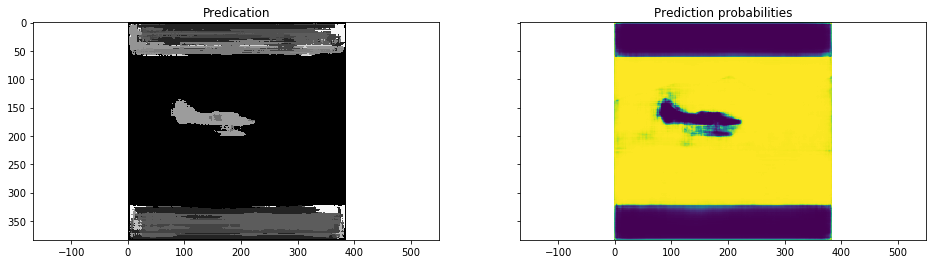

Train step: 11000 	Traing Loss: 0.177312 	mIOU: 0.57639 	Accuracy: 0.637419


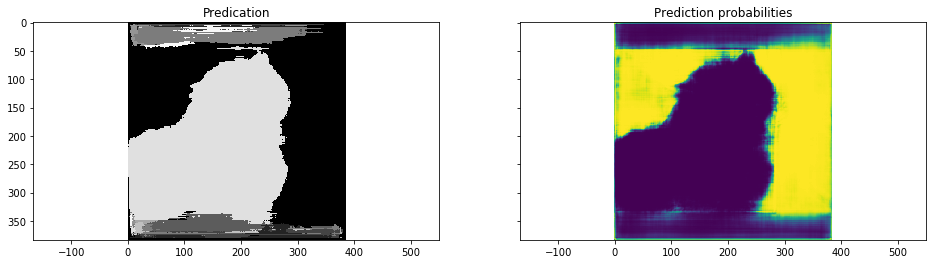

Train step: 11100 	Traing Loss: 0.123756 	mIOU: 0.578257 	Accuracy: 0.637745


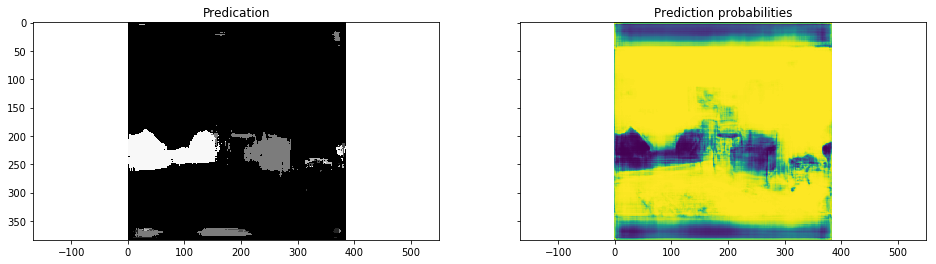

Train step: 11200 	Traing Loss: 0.128203 	mIOU: 0.579976 	Accuracy: 0.638049


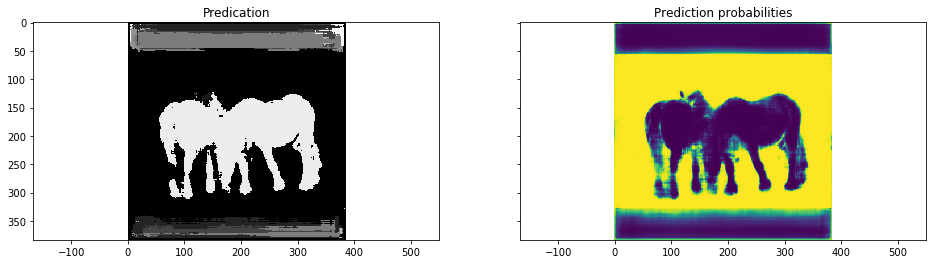

Train step: 11300 	Traing Loss: 0.172976 	mIOU: 0.581789 	Accuracy: 0.638345


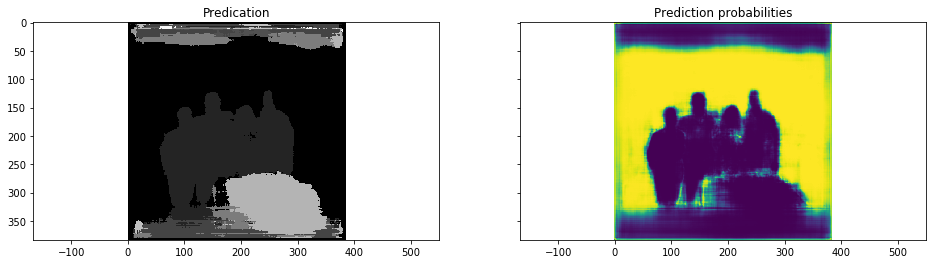

Train step: 11400 	Traing Loss: 0.181208 	mIOU: 0.583628 	Accuracy: 0.638657


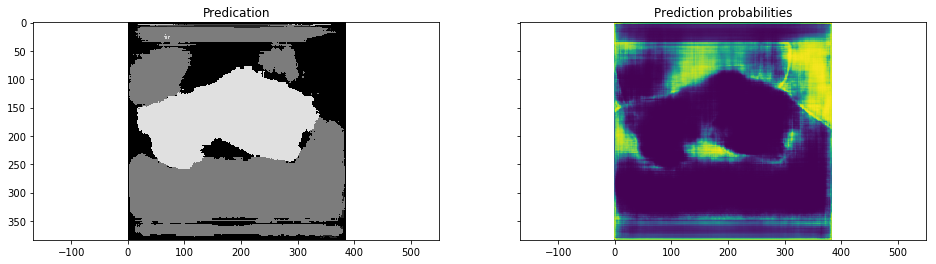

Train step: 11500 	Traing Loss: 0.146332 	mIOU: 0.585307 	Accuracy: 0.638967


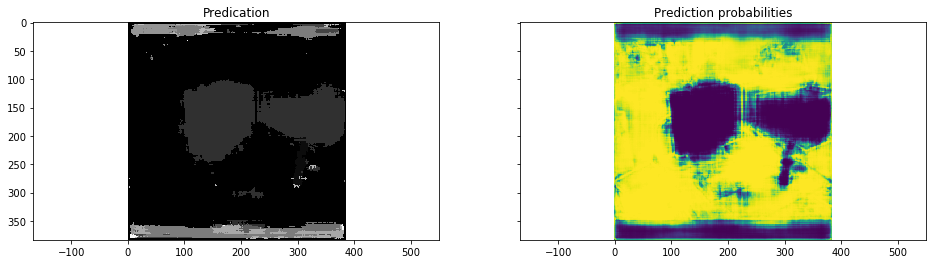

Train step: 11600 	Traing Loss: 0.114795 	mIOU: 0.587052 	Accuracy: 0.63928


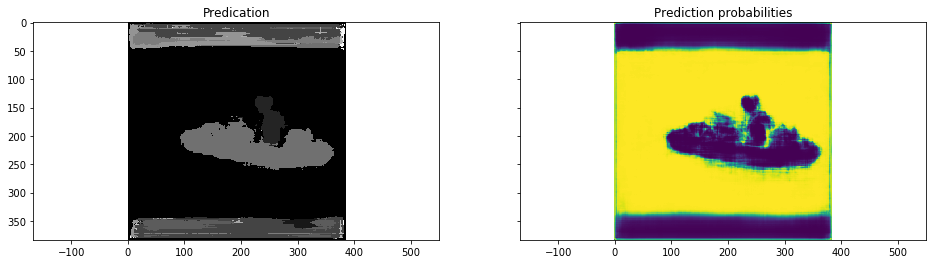

Train step: 11700 	Traing Loss: 0.276521 	mIOU: 0.588847 	Accuracy: 0.639604


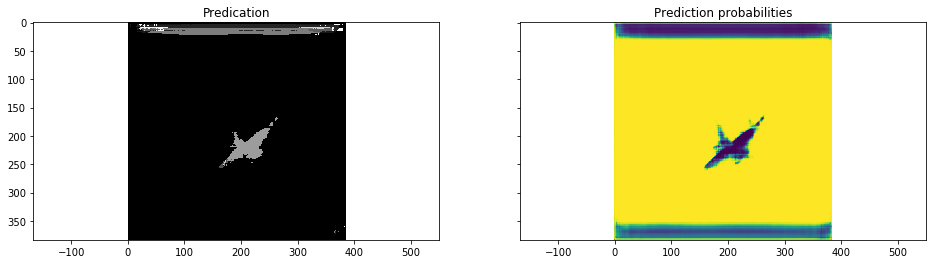

Train step: 11800 	Traing Loss: 0.152513 	mIOU: 0.590524 	Accuracy: 0.63991


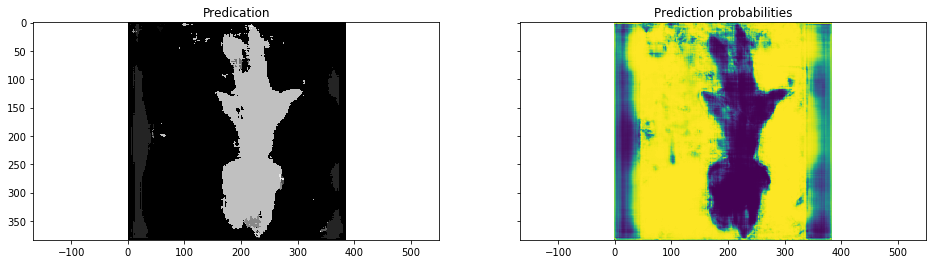

Train step: 11900 	Traing Loss: 0.161844 	mIOU: 0.592111 	Accuracy: 0.640183


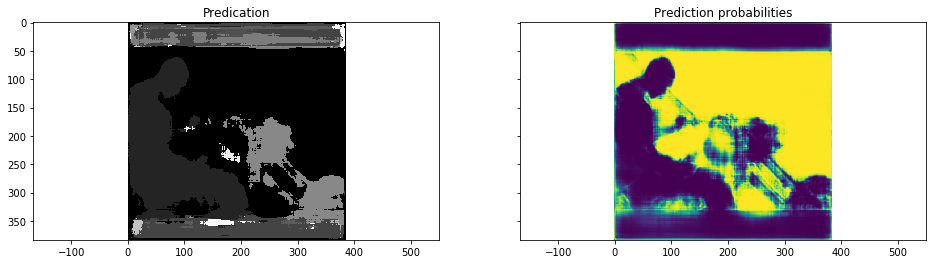

Train step: 12000 	Traing Loss: 0.119591 	mIOU: 0.59385 	Accuracy: 0.640473


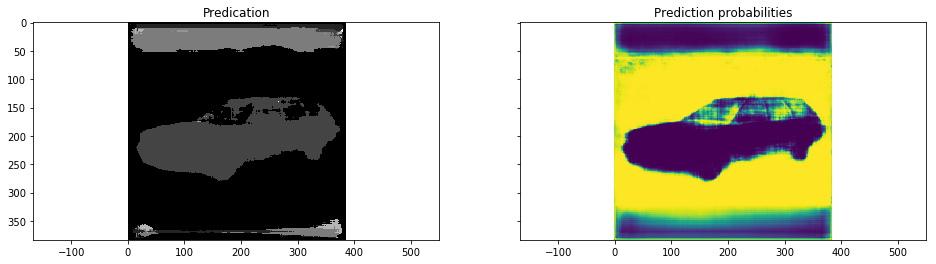

Train step: 12100 	Traing Loss: 0.133548 	mIOU: 0.595507 	Accuracy: 0.640792


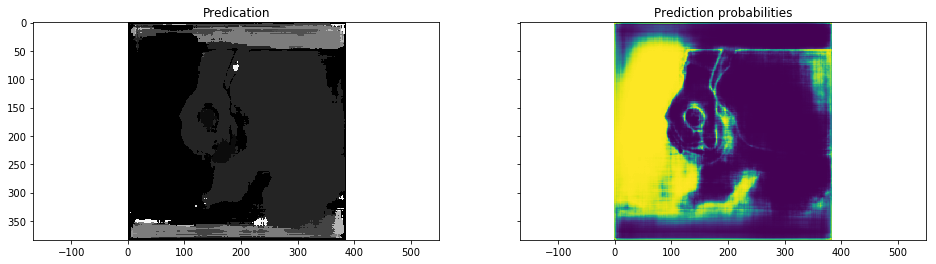

Train step: 12200 	Traing Loss: 0.127031 	mIOU: 0.597049 	Accuracy: 0.641112


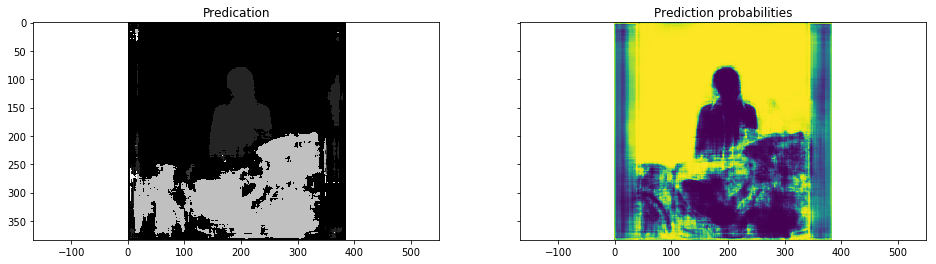

Train step: 12300 	Traing Loss: 0.124788 	mIOU: 0.598753 	Accuracy: 0.641385


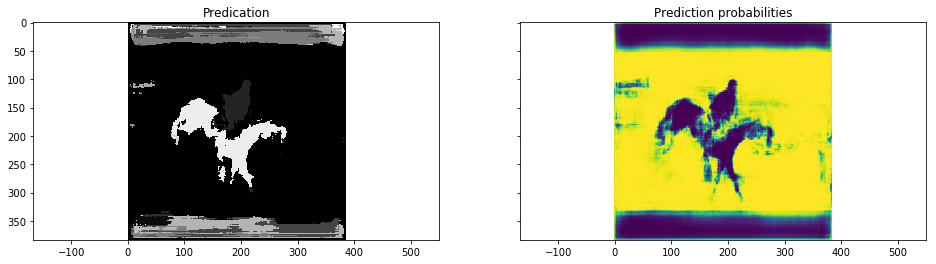

Train step: 12400 	Traing Loss: 0.109247 	mIOU: 0.60036 	Accuracy: 0.641686


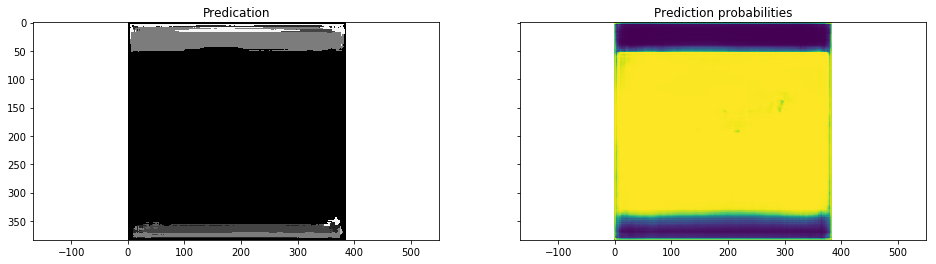

Train step: 12500 	Traing Loss: 0.201956 	mIOU: 0.601892 	Accuracy: 0.641981


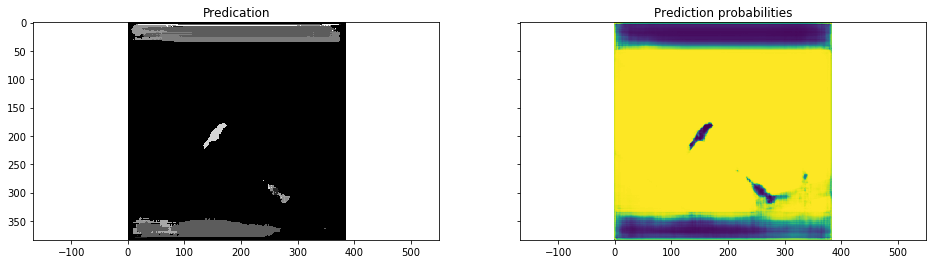

Train step: 12600 	Traing Loss: 0.130746 	mIOU: 0.603536 	Accuracy: 0.642252


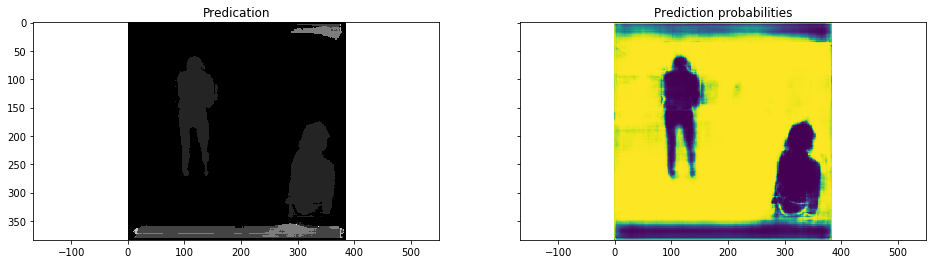

Train step: 12700 	Traing Loss: 0.125365 	mIOU: 0.605101 	Accuracy: 0.64255


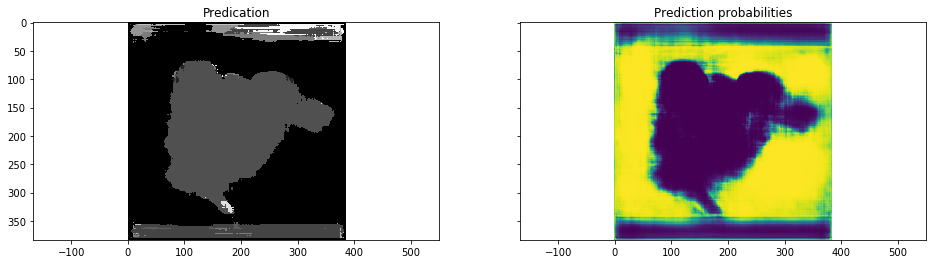

Train step: 12800 	Traing Loss: 0.110695 	mIOU: 0.606596 	Accuracy: 0.642838


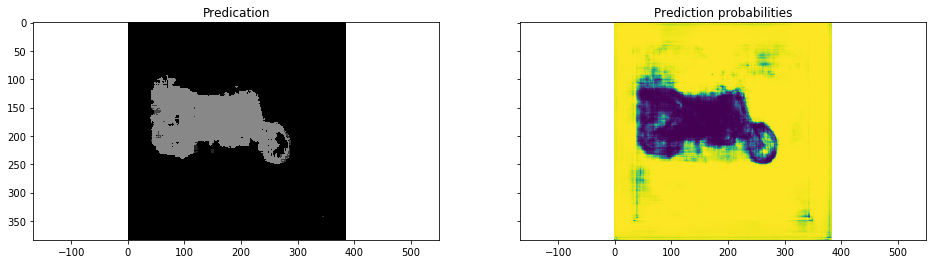

Train step: 12900 	Traing Loss: 0.153043 	mIOU: 0.608162 	Accuracy: 0.64312


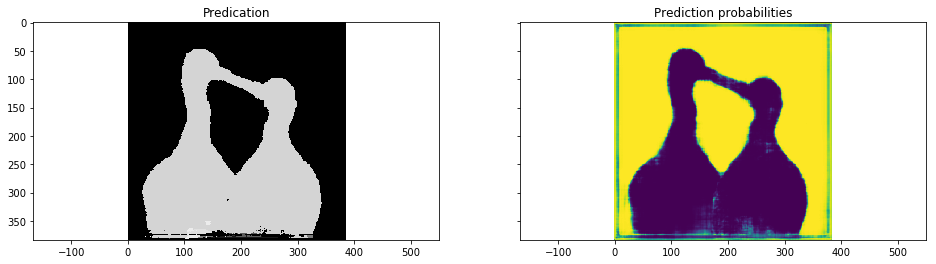

Train step: 13000 	Traing Loss: 0.145259 	mIOU: 0.6097 	Accuracy: 0.643384


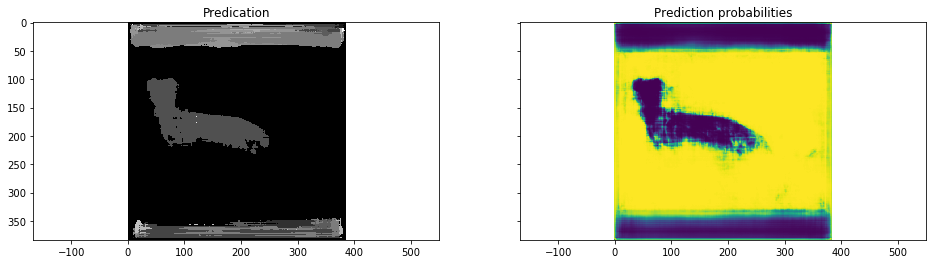

Train step: 13100 	Traing Loss: 0.0784146 	mIOU: 0.611138 	Accuracy: 0.643676


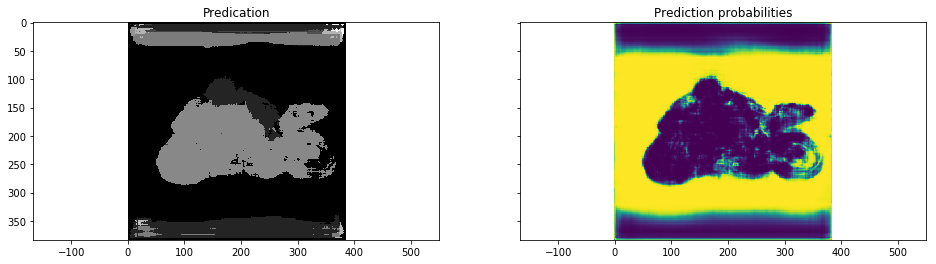

Train step: 13200 	Traing Loss: 0.124917 	mIOU: 0.612655 	Accuracy: 0.643936


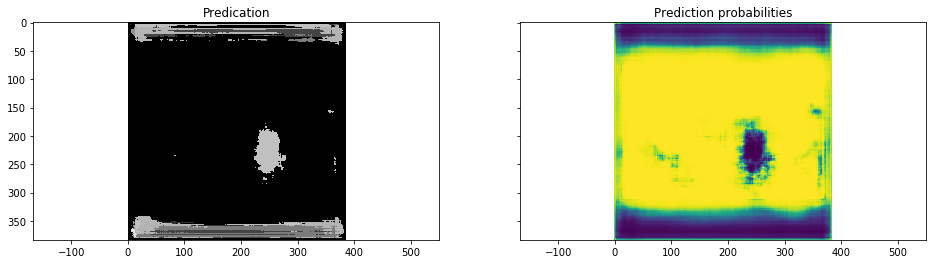

Train step: 13300 	Traing Loss: 0.121454 	mIOU: 0.614146 	Accuracy: 0.644192


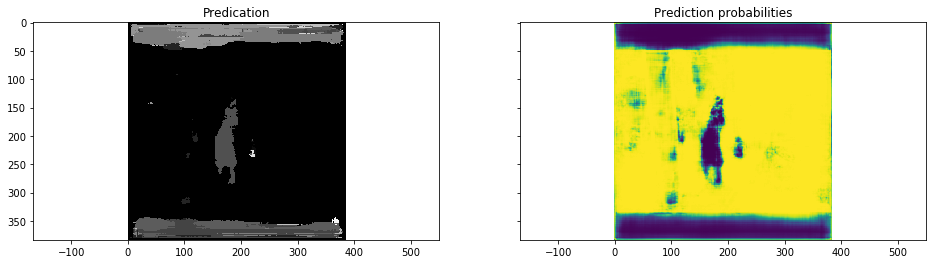

Train step: 13400 	Traing Loss: 0.100273 	mIOU: 0.615574 	Accuracy: 0.644436


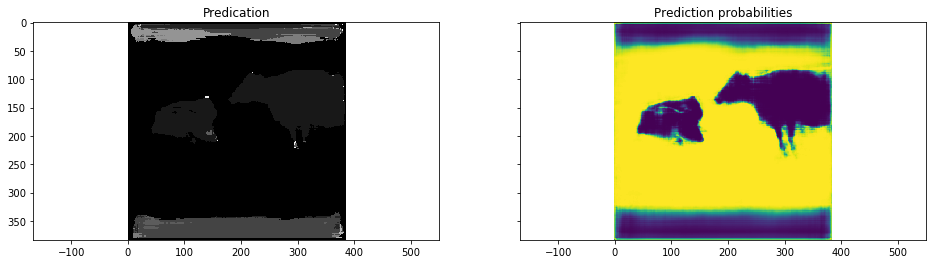

Train step: 13500 	Traing Loss: 0.0782653 	mIOU: 0.617039 	Accuracy: 0.644715


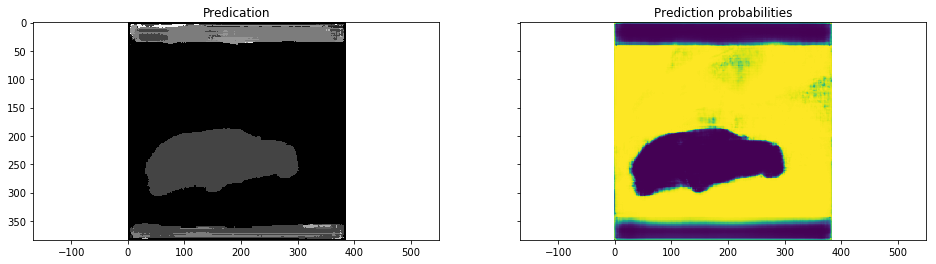

Train step: 13600 	Traing Loss: 0.165022 	mIOU: 0.618546 	Accuracy: 0.644987


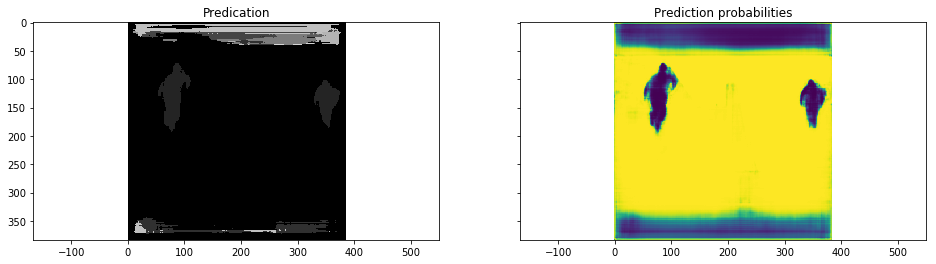

Train step: 13700 	Traing Loss: 0.134126 	mIOU: 0.619906 	Accuracy: 0.645226


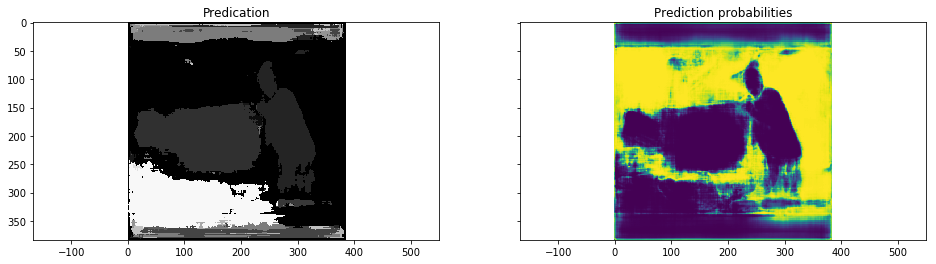

Train step: 13800 	Traing Loss: 0.093061 	mIOU: 0.621307 	Accuracy: 0.645445


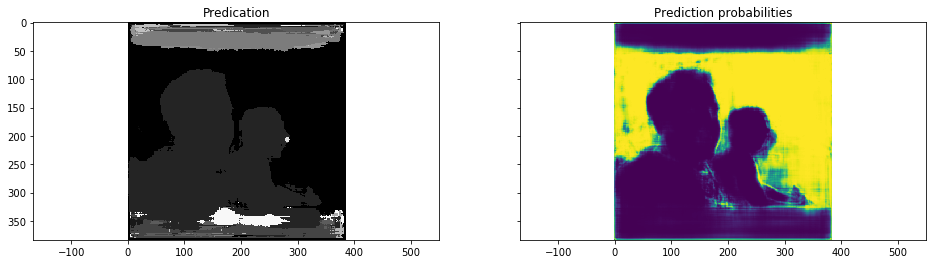

In [ ]:
# Initializer for new fc8 weights -- for two classes.
vgg_fc8_weights_initializer = tf.variables_initializer(vgg_fc8_weights)

# Initializer for adam variables
optimization_variables_initializer = tf.variables_initializer(adam_optimizer_variables)

model_vars = tf.variables_initializer(model_variables)

# Create a saver.
saver = tf.train.Saver()

with tf.Session() as sess:
    
    # Run the initializers.
    read_vgg_weights_except_fc8_func(sess)
    sess.run(vgg_fc8_weights_initializer)
    sess.run(optimization_variables_initializer)
    sess.run(tf.local_variables_initializer())
    sess.run(model_vars)
    
    # Start input enqueue threads.
    coord = tf.train.Coordinator()
    threads = tf.train.start_queue_runners(sess=sess, coord=coord)

    try:
        for step in range(total_train_steps):

            _, train_loss, pred_np, probabilities_np, tmp1, tmp2 = sess.run([train_step, cross_entropy_sum, pred, 
                                                                      probabilities, miou_update_op, acc_update_op],
                                            feed_dict={is_training_placeholder: True})

            if step % 100 == 0:
                miou_np = sess.run(miou)
                accuracy = sess.run(acc)
                
                pred_annotation = np.expand_dims(pred_np[0], axis=2).astype(float)
                print("Train step:", step, "\tTraing Loss:", train_loss, "\tmIOU:", miou_np, "\tAccuracy:", accuracy)
            
                cmap = plt.get_cmap('bwr')
                f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
                f.set_figheight(4)
                f.set_figwidth(16)
                
                ax1.imshow(np.dstack((pred_annotation,)*3)*100)
                ax1.set_title('Predication')
                probability_graph = ax2.imshow(probabilities_np[0].squeeze()[:, :, 0])
                ax2.set_title('Prediction probabilities')
                plt.show()

                saver.save(sess, './checkpoints_2/FCNCheckpoints')

    except tf.errors.OutOfRangeError:
        print('Done training -- epoch limit reached')
    finally:
        # When done, ask the threads to stop.
        coord.request_stop()
        
    saver.save(sess, './checkpoints_2/FCNCheckpoints')
    summary_string_writer.close()

In [7]:
image_name = "./images/test"
image_tensor = tf.read_file(image_name + ".jpg")
image_tensor = tf.image.decode_jpeg(image_tensor, channels=3)
image_tensor = tf.cast(tf.expand_dims(image_tensor, axis=0), tf.float32)
#image_tensor = tf.image.resize_images(image_tensor, (416,448))

In [8]:
is_training_placeholder = model_input()
upsampled_by_factor_16_logits = model(image_tensor, number_of_classes=21, is_training=False)
pred = tf.argmax(upsampled_by_factor_16_logits, dimension=3)
probabilities = tf.nn.softmax(upsampled_by_factor_16_logits)

INFO:tensorflow:Restoring parameters from ./checkpoints_2/FCNCheckpoints
Model restored.


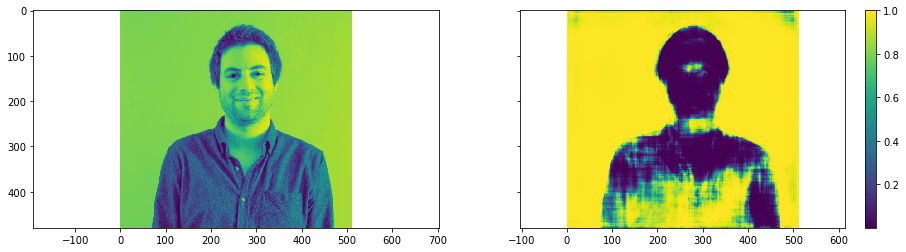

In [9]:
saver = tf.train.Saver()
with tf.Session() as sess:
    # Restore variables from disk.
    saver.restore(sess, "./checkpoints_2/FCNCheckpoints")
    print("Model restored.")
    
    pred_np, probabilities_np, image = sess.run([pred, probabilities, image_tensor],
                                          feed_dict={is_training_placeholder: False})

    cmap = plt.get_cmap('bwr')
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
    f.set_figheight(4)
    f.set_figwidth(16)
    ax1.imshow(image.squeeze()[:, :, 0])
    probability_graph = ax2.imshow(probabilities_np[0].squeeze()[:, :, 0])

    plt.colorbar(probability_graph)
    plt.show()

(1, 480, 512)


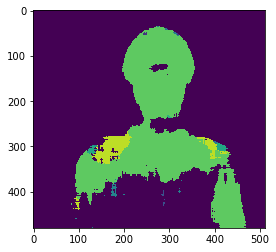

In [10]:
print(pred_np.shape)
plt.imshow(np.squeeze(pred_np))